# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = '../results/DE/mammals/ANOVA_zscore/'

In [3]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']

In [4]:
os.listdir(de_dir_path)

['anova_zscore_human_sig_genes.csv',
 'anova_zscore_mamm.csv',
 'cluster_spectr_anova_6.csv',
 'cluster_spectr_anova_7.csv',
 'cluster_spectr_anova_8.csv',
 'cluster_spectr_anova_9.csv',
 'cluster_spectr_hs_6.csv',
 'cluster_spectr_hs_7.csv',
 'cluster_spectr_hs_8.csv',
 'cluster_spectr_hs_9.csv',
 'desktop.ini',
 'human_specific_genes_6.csv',
 'ssGSEA_human_sig_genes.csv',
 'ttest_human_sig_genes.csv',
 'ttest_sign_genes.csv',
 'ttest_zscore_human_monkeys.csv',
 'ttest_zscore_mamm.csv']

### DE results

In [5]:
anova_res = pd.read_csv(de_dir_path + 'anova_zscore_mamm.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
NOC2L,6.384890,12.0,0.813337,0.635908,0.716158
HES4,15.058197,12.0,1.878258,0.052758,0.121203
AGRN,15.583493,12.0,3.171660,0.001230,0.007732
SDF4,14.214074,12.0,1.574430,0.120231,0.220228
B3GALT6,12.113356,12.0,1.676662,0.091658,0.181660


In [6]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_zscore_mamm.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,AGRN,L1,human,chimp,0.334627,0.749294,0.871771
1,ANKRD65,L1,human,chimp,-0.558470,0.596733,0.772328
2,TMEM240,L1,human,chimp,2.100247,0.080450,0.274743
3,NADK,L1,human,chimp,-5.641027,0.001330,0.038326
4,GNB1,L1,human,chimp,0.164405,0.874811,0.941712


In [7]:
n_clusters = 7
anova_labels = pd.read_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv', index_col=0)['0'].sort_values()
anova_labels = anova_labels + 1
anova_labels.name = 'ANOVA_labels'

In [8]:
hum_spec_onehot = pd.read_csv('results/hum_spec_onehot.csv', index_col=0)
hum_spec_onehot

,HES4,AGRN,SDF4,B3GALT6,SCNN1D,PUSL1,INTS11,AURKAIP1,MRPL20,ANKRD65,...,CFAP410,TRPM2,UBE2G2,PTTG1IP,FAM207A,ADARB1,POFUT2,COL18A1,YBEY,PRMT2
L1,0,0,0,0,1,0,0,0,1,1,...,1,0,0,0,0,1,0,0,1,0
L2,0,0,0,1,1,0,0,0,0,0,...,0,1,0,0,0,0,1,1,0,0
L3,0,0,0,1,1,0,0,1,0,1,...,0,0,1,0,0,0,1,1,0,0
L4,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
L5,1,1,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
L6,1,1,1,1,1,1,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
WM,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,1,0,1,0,0,0


## Load normalized pseudobulks

In [9]:
pb_dir_path = '../data/pseudobulks/'

In [10]:
os.listdir(pb_dir_path)

['pb_age.h5ad',
 'pb_mammals.h5ad',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_mean.h5ad',
 'pb_mammals_samplenorm_zscore.h5ad']

In [11]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_zscore.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

In [12]:
adata_pb_norm_mean = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_mean.h5ad')
#adata_pb_norm_mean.var = anova_res
adata_pb_norm_mean

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

# Z-transform-like normalization

## Calculate differencies

In [13]:
adata_pb_norm[(adata_pb_norm.obs.condition == 'human') & (adata_pb_norm.obs.layer == 'L1')].obs

,layer,sample_id,psbulk_n_cells,psbulk_counts,condition,lib_size,log_lib_size
human_759_L1,L1,human_759,500.0,961453.0,human,1922.906006,7.561593
human_j12_L1,L1,human_j12,331.0,827957.0,human,2501.380859,7.824598
human_j3_L1,L1,human_j3,110.0,378096.0,human,3437.236328,8.142423
human_j4_L1,L1,human_j4,238.0,770218.0,human,3236.209961,8.082158
human_j6_L1,L1,human_j6,134.0,255642.0,human,1907.776123,7.553693


In [14]:
# calculate average expr for each layer of each specie
mean_norm_expr_dict = dict()
for specie in ['human', 'chimp', 'macaque']:
    mean_norm_expr = pd.DataFrame(index=adata_pb_norm.var_names, columns=layers)
    for layer in layers:
        mean_norm_expr[layer] = np.array(adata_pb_norm[(adata_pb_norm.obs.condition == specie) &
                                                       (adata_pb_norm.obs.layer == layer)].X.mean(axis=0))
    mean_norm_expr_dict[specie] = mean_norm_expr

In [15]:
# calculate diff
human_chimp_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['chimp']
human_macaque_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['macaque']
chimp_macaque_diff = mean_norm_expr_dict['chimp'] - mean_norm_expr_dict['macaque']

Text(0.5, 1.0, 'chimp vs macaque diff')

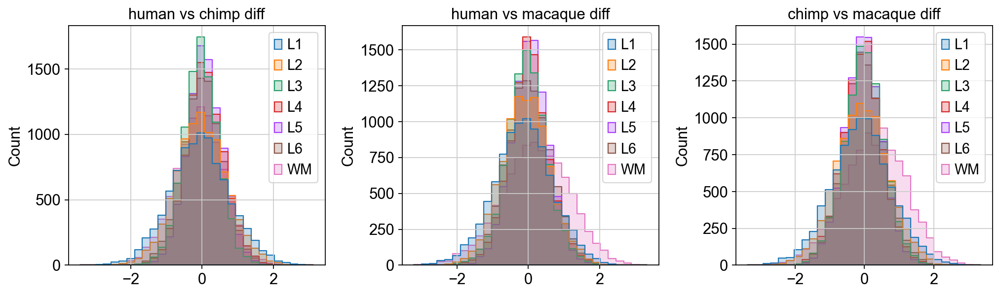

In [16]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), gridspec_kw={'wspace': 0.3})

sns.histplot(human_chimp_diff, bins=30, element="step", ax=ax[0])
ax[0].set_title('human vs chimp diff')

sns.histplot(human_macaque_diff, bins=30, element="step", ax=ax[1])
ax[1].set_title('human vs macaque diff')

sns.histplot(chimp_macaque_diff, bins=30, element="step", ax=ax[2])
ax[2].set_title('chimp vs macaque diff')

## Calculate the ratio

Load human vs chimp and human vs macaque differecies to one dataframe

In [17]:
hum_stack = human_chimp_diff.stack().to_frame().swaplevel(1, 0)
hum_stack.columns = ['human_chimp_diff']
hum_stack['human_macaque_diff'] = human_macaque_diff.stack().swaplevel(1, 0)
hum_stack['ΔHC - ΔHM'] = hum_stack['human_chimp_diff'] - hum_stack['human_macaque_diff']
hum_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC - ΔHM
L1,NOC2L,-0.905086,-1.018086,0.113000
L2,NOC2L,1.081197,-0.573703,1.654900
L3,NOC2L,-0.537651,0.948931,-1.486582
L4,NOC2L,-0.221108,0.826215,-1.047323
L5,NOC2L,0.084847,0.226093,-0.141246


Add t-test results for ANOVA significant genes

In [18]:
hum_stack['hc_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'chimp')].set_index(['layer', 'gene']).p_val_adj
hum_stack['hm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack['cm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'chimp') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack.head()

#hum_stack['mult_diff'] = hum_stack['human_chimp_diff'] * hum_stack['human_macaque_diff']
#hum_spec_stack = hum_stack[hum_stack.mult_diff > 0].sort_index()
#hum_spec_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC - ΔHM,hc_p_val_adj,hm_p_val_adj,cm_p_val_adj
L1,NOC2L,-0.905086,-1.018086,0.113000,NaN,NaN,NaN
L2,NOC2L,1.081197,-0.573703,1.654900,NaN,NaN,NaN
L3,NOC2L,-0.537651,0.948931,-1.486582,NaN,NaN,NaN
L4,NOC2L,-0.221108,0.826215,-1.047323,NaN,NaN,NaN
L5,NOC2L,0.084847,0.226093,-0.141246,NaN,NaN,NaN


Text(0, 0.5, 'Number of genes')

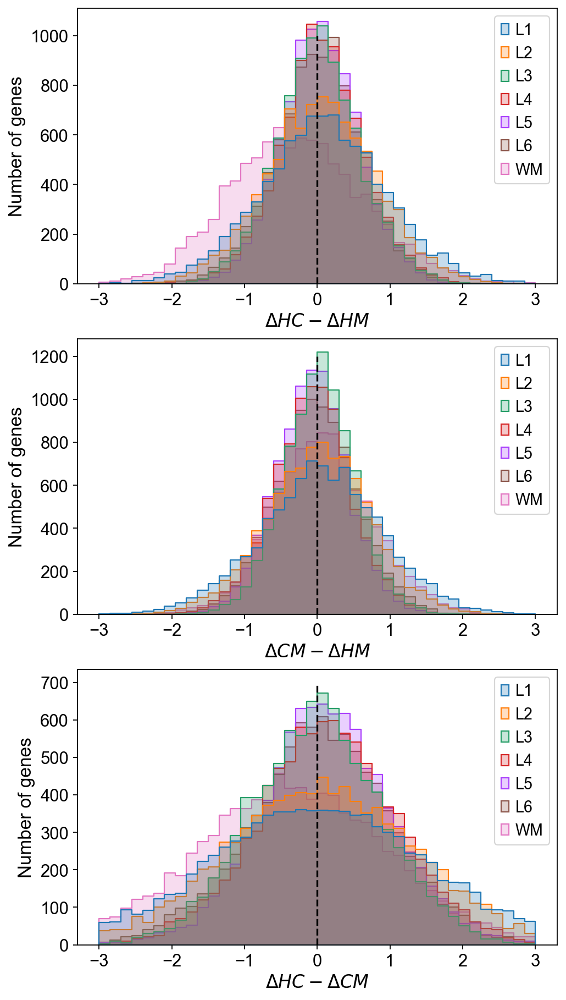

In [19]:
fig, ax = plt.subplots(3, 1, figsize=(7, 14))

data_to_plot = human_chimp_diff - human_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[0])
ax[0].vlines(0, ymin=0, ymax=1000, colors='black', linestyles='dashed')
ax[0].grid(False)
ax[0].set_xlabel('$\Delta HC - \Delta HM$', fontsize=15)
ax[0].set_ylabel('Number of genes', fontsize=15)

data_to_plot = chimp_macaque_diff - human_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[1])
ax[1].vlines(0, ymin=0, ymax=1200, colors='black', linestyles='dashed')
ax[1].grid(False)
ax[1].set_xlabel('$\Delta CM - \Delta HM$', fontsize=15)
ax[1].set_ylabel('Number of genes', fontsize=15)

data_to_plot = human_chimp_diff - chimp_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[2])
ax[2].vlines(0, ymin=0, ymax=700, colors='black', linestyles='dashed')
ax[2].grid(False)
ax[2].set_xlabel('$\Delta HC - \Delta CM$', fontsize=15)
ax[2].set_ylabel('Number of genes', fontsize=15)

## Filter specie-specific profiles

### Let's explore

In [20]:
#human_chimp_diff, human_macaque_diff, chimp_macaque_diff

In [21]:
hc_l1 = human_chimp_diff.abs().sum(axis=1)
hm_l1 = human_macaque_diff.abs().sum(axis=1)
cm_l1 = chimp_macaque_diff.abs().sum(axis=1)

(0.0, 10.0)

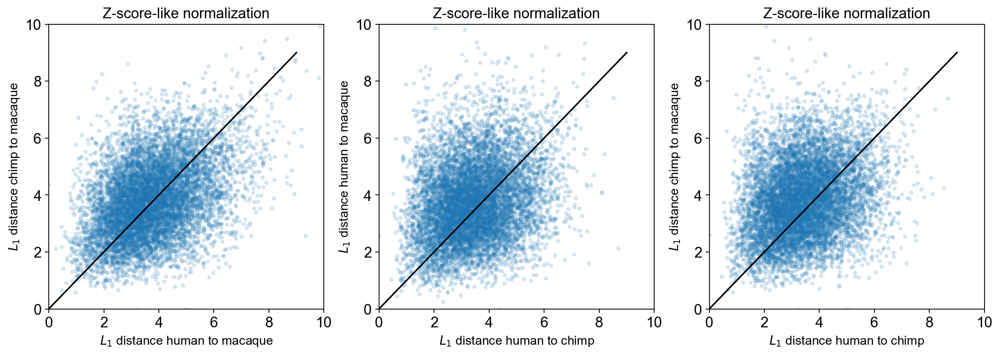

In [22]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

ax[0].plot(hm_l1, cm_l1, '.', alpha=0.15)
ax[0].plot([0, 9], [0, 9], 'black')
ax[0].set_title('Z-score-like normalization')
ax[0].set_xlabel('$L_1$ distance human to macaque', fontsize=12)
ax[0].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 10)
ax[0].set_ylim(0, 10)

ax[1].plot(hc_l1, hm_l1, '.', alpha=0.15)
ax[1].plot([0, 9], [0, 9], 'black')
ax[1].set_title('Z-score-like normalization')
ax[1].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[1].set_ylabel('$L_1$ distance human to macaque', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 10)
ax[1].set_ylim(0, 10)

ax[2].plot(hc_l1, cm_l1, '.', alpha=0.15)
ax[2].plot([0, 9], [0, 9], 'black')
ax[2].set_title('Z-score-like normalization')
ax[2].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[2].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 10)
ax[2].set_ylim(0, 10)

In [23]:
hc_l1 = human_chimp_diff.abs().sum(axis=1)
hm_l1 = human_macaque_diff.abs().sum(axis=1)
cm_l1 = chimp_macaque_diff.abs().sum(axis=1)

(0.0, 10.0)

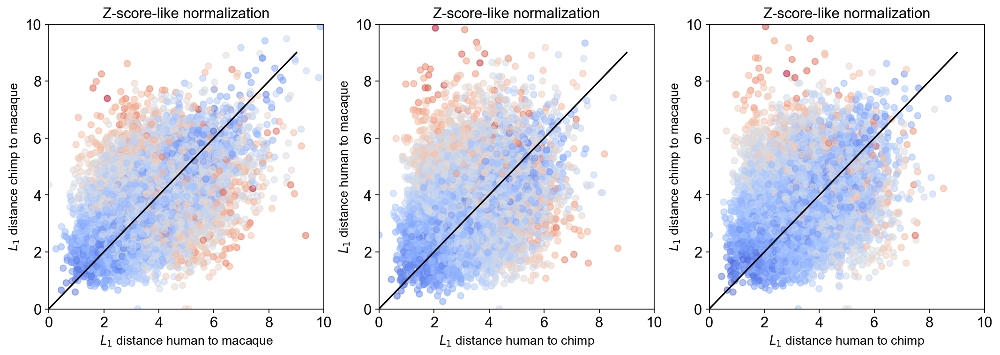

In [24]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

ax[0].scatter(hm_l1, cm_l1, alpha=0.5, c=hc_l1, cmap='coolwarm')
ax[0].plot([0, 9], [0, 9], 'black')
ax[0].set_title('Z-score-like normalization')
ax[0].set_xlabel('$L_1$ distance human to macaque', fontsize=12)
ax[0].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 10)
ax[0].set_ylim(0, 10)

ax[1].scatter(hc_l1, hm_l1, alpha=0.5, c=cm_l1, cmap='coolwarm')
ax[1].plot([0, 9], [0, 9], 'black')
ax[1].set_title('Z-score-like normalization')
ax[1].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[1].set_ylabel('$L_1$ distance human to macaque', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 10)
ax[1].set_ylim(0, 10)

ax[2].scatter(hc_l1, cm_l1, alpha=0.5, c=hm_l1, cmap='coolwarm')
ax[2].plot([0, 9], [0, 9], 'black')
ax[2].set_title('Z-score-like normalization')
ax[2].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[2].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 10)
ax[2].set_ylim(0, 10)

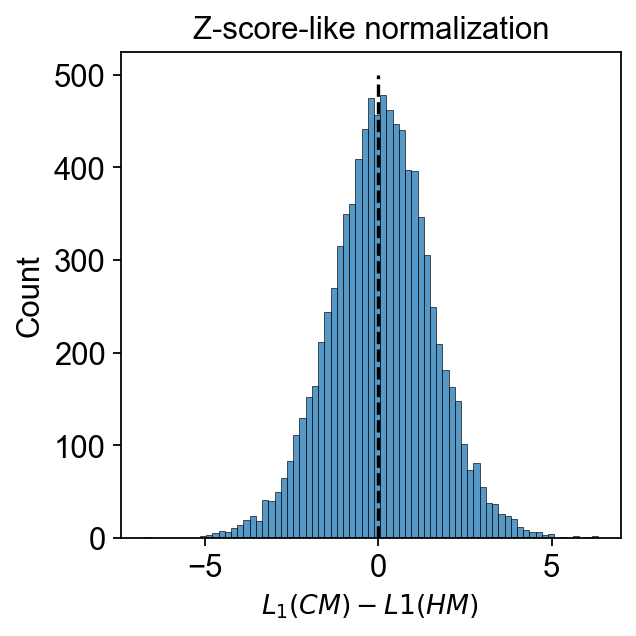

In [25]:
sns.histplot(cm_l1 - hm_l1)
plt.vlines(0, ymin=0, ymax=500, colors='black', linestyles='dashed')
plt.title('Z-score-like normalization')
plt.xlabel('$L_1(CM) - L1(HM)$ ', fontsize=12)
plt.grid(False)

In [26]:
((cm_l1 - hm_l1) < 0).sum(), ((cm_l1 - hm_l1) > 0).sum()

(4319, 4888)

### Human-specific

Filter genes:
$$
L_1(HM) > L_1(CM)
$$

and

$$
L_1(HC) >= q
$$

In [27]:
quantile = 0.95
quant_value = hc_l1.quantile(quantile)
quant_value

5.615865572011511

Text(0.5, 1.0, '$L_1$ distance human vs chimp')

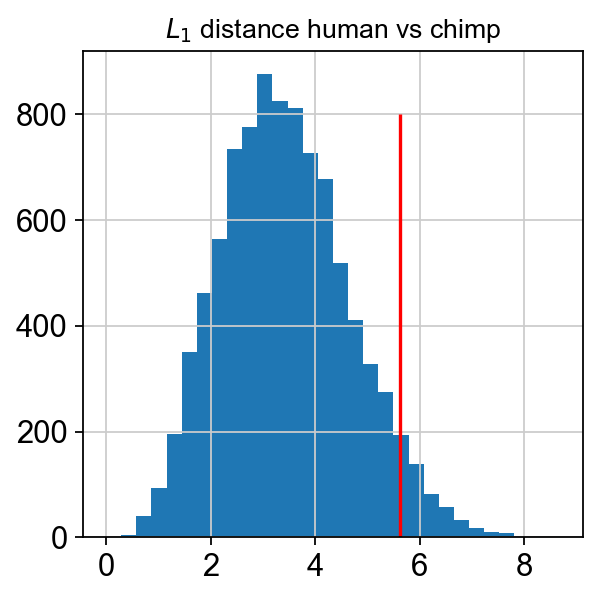

In [28]:
plt.vlines(quant_value, ymin=0, ymax=800,colors='red')
hc_l1.hist(bins=30)
plt.title('$L_1$ distance human vs chimp', fontsize=12)

In [29]:
gene_filter1 = (hm_l1 > cm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

461

In [30]:
hs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
hs_genes

Index(['NPHP4', 'PARK7', 'FBXO42', 'ZNF593', 'PTP4A2', 'POMGNT1', 'ZYG11B',
       'PGM1', 'HS2ST1', 'BTBD8',
       ...
       'BLVRB', 'PIH1D1', 'CTU1', 'SMIM17', 'TMEM121B', 'HDHD5', 'SLC25A1',
       'AIFM3', 'TBC1D10A', 'TNRC6B'],
      dtype='object', length=224)

### Chimp-specific

In [31]:
gene_filter1 = (cm_l1 > hm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

461

In [32]:
cs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
cs_genes

Index(['CAMTA1', 'PLOD1', 'RCC2', 'IGSF21', 'SYF2', 'MACO1', 'TMEM39B',
       'INPP5B', 'P3H1', 'HYI',
       ...
       'NUMBL', 'ITPKC', 'PVR', 'ZNF677', 'ZNF444', 'SMTN', 'RASD2', 'ACO2',
       'MORC3', 'COL6A2'],
      dtype='object', length=237)

### Macaque-specific

In [33]:
gene_filter1 = (hm_l1 > hc_l1)
gene_filter2 = (cm_l1 >= quant_value)
gene_filter2.sum()

915

In [34]:
ms_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
ms_genes

Index(['INTS11', 'TMEM240', 'ENO1', 'TARDBP', 'MTOR', 'ARHGEF10L', 'ALDH4A1',
       'ECE1', 'USP48', 'SLC9A1',
       ...
       'HIRA', 'DGCR8', 'MN1', 'GCAT', 'PICK1', 'L3MBTL2', 'NDUFA6', 'SELENOO',
       'APP', 'CBR1'],
      dtype='object', length=578)

### Compare a number of human-specific vs chimp-specific

In [35]:
qv_list = np.linspace(5, 10)
hs_num = []
cs_num = []
ms_num = []
quant_list = [0.8, 0.85, 0.9, 0.95, 0.96, 0.97, 0.98, 0.99, 0.995, 0.999]
for qv in qv_list:
    #qv = hc_l1.quantile(q)
    # hs
    gene_filter1 = (hm_l1 > cm_l1)
    gene_filter2 = (hc_l1 >= qv)
    hs_num.append(hc_l1[(gene_filter1) & (gene_filter2)].index.size)
    # cs
    gene_filter1 = (cm_l1 > hm_l1)
    gene_filter2 = (hc_l1 >= qv)
    cs_num.append(hc_l1[(gene_filter1) & (gene_filter2)].index.size)
    # ms
    gene_filter1 = (hm_l1 > hc_l1)
    gene_filter2 = (cm_l1 >= qv)
    ms_num.append(hm_l1[(gene_filter1) & (gene_filter2)].index.size)

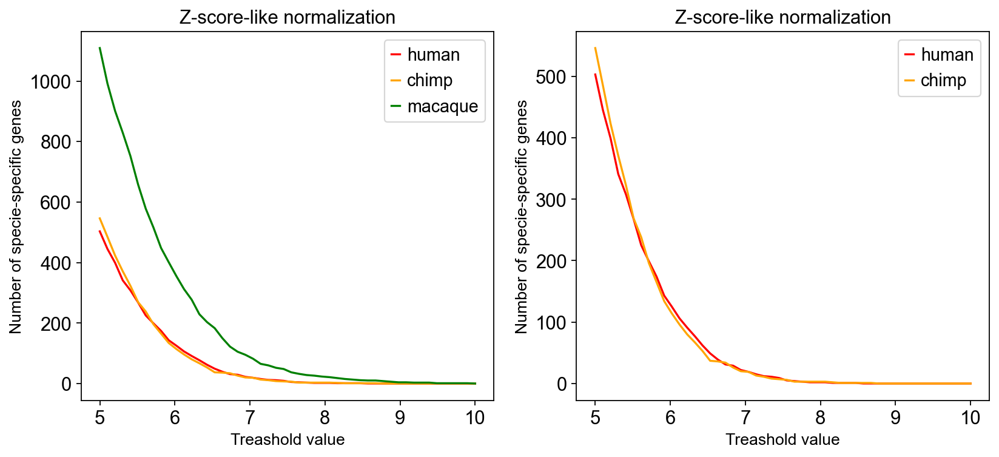

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(qv_list, hs_num, 'r-')
ax[0].plot(qv_list, cs_num, '-', c='orange')
ax[0].plot(qv_list, ms_num, '-', c='green')
ax[0].set_title('Z-score-like normalization')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('Number of specie-specific genes', fontsize=12)
ax[0].legend(['human', 'chimp', 'macaque'])
ax[0].grid(False)

ax[1].plot(qv_list, hs_num, 'r-')
ax[1].plot(qv_list, cs_num, '-', c='orange')
ax[1].set_title('Z-score-like normalization')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('Number of specie-specific genes', fontsize=12)
ax[1].legend(['human', 'chimp', 'macaque'])
ax[1].grid(False)

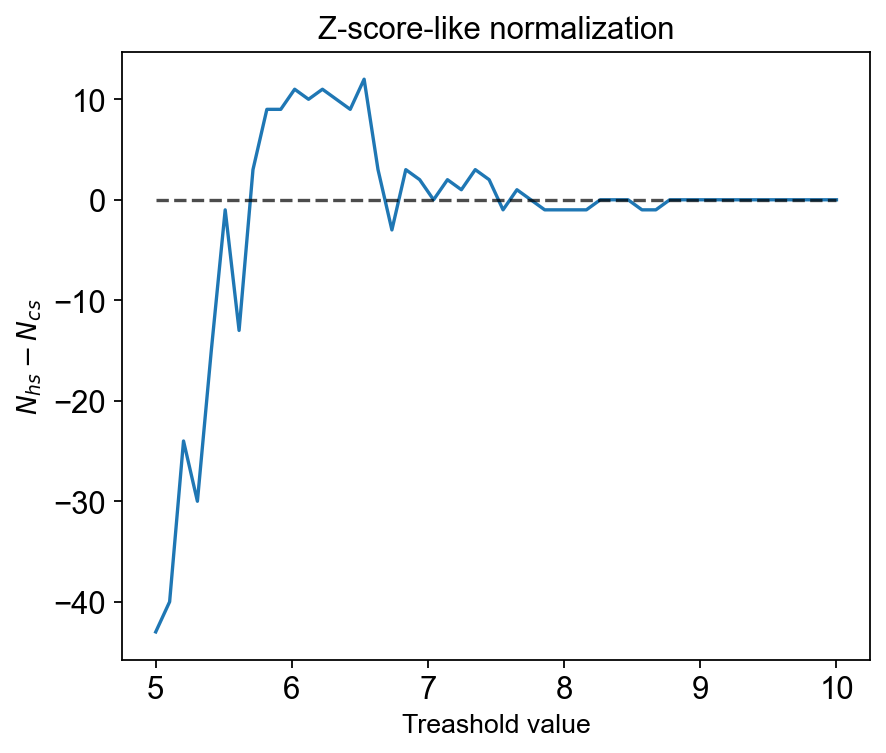

In [37]:
fig, ax = plt.subplots(figsize=(6, 5))
plt.plot(qv_list, np.array(hs_num) - np.array(cs_num), '-')
plt.hlines(0, xmin=5, xmax=10, colors='black', linestyles='dashed', alpha=0.7)
plt.title('Z-score-like normalization')
plt.xlabel('Treashold value', fontsize=12)
plt.ylabel('$N_{hs} - N_{cs}$', fontsize=12)
plt.grid(False)

# Normalization on average

## Calculate differencies

In [38]:
adata_pb_norm_mean[(adata_pb_norm_mean.obs.condition == 'human') & (adata_pb_norm_mean.obs.layer == 'L1')].obs

,layer,sample_id,psbulk_n_cells,psbulk_counts,condition,lib_size,log_lib_size
human_759_L1,L1,human_759,500.0,961453.0,human,1922.906006,7.561593
human_j12_L1,L1,human_j12,331.0,827957.0,human,2501.380859,7.824598
human_j3_L1,L1,human_j3,110.0,378096.0,human,3437.236328,8.142423
human_j4_L1,L1,human_j4,238.0,770218.0,human,3236.209961,8.082158
human_j6_L1,L1,human_j6,134.0,255642.0,human,1907.776123,7.553693


In [39]:
# calculate average expr for each layer of each specie
mean_norm_expr_dict = dict()
for specie in ['human', 'chimp', 'macaque']:
    mean_norm_expr = pd.DataFrame(index=adata_pb_norm_mean.var_names, columns=layers)
    for layer in layers:
        mean_norm_expr[layer] = np.array(adata_pb_norm_mean[(adata_pb_norm_mean.obs.condition == specie) &
                                                       (adata_pb_norm_mean.obs.layer == layer)].X.mean(axis=0))
    mean_norm_expr_dict[specie] = mean_norm_expr

In [40]:
# calculate diff
human_chimp_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['chimp']
human_macaque_diff = mean_norm_expr_dict['human'] - mean_norm_expr_dict['macaque']
chimp_macaque_diff = mean_norm_expr_dict['chimp'] - mean_norm_expr_dict['macaque']

Text(0.5, 1.0, 'chimp vs macaque diff')

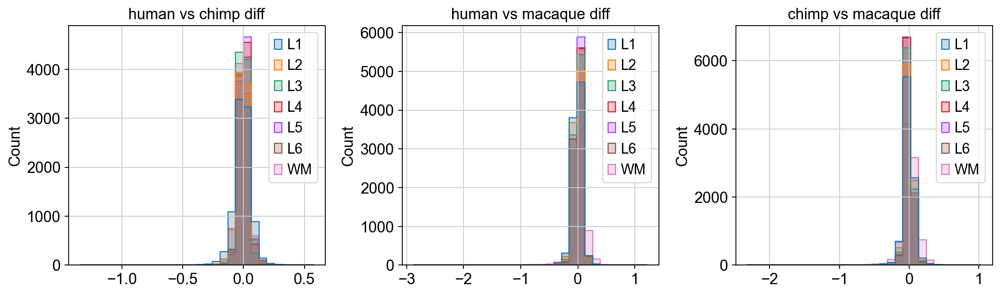

In [41]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4), gridspec_kw={'wspace': 0.3})

sns.histplot(human_chimp_diff, bins=30, element="step", ax=ax[0])
ax[0].set_title('human vs chimp diff')

sns.histplot(human_macaque_diff, bins=30, element="step", ax=ax[1])
ax[1].set_title('human vs macaque diff')

sns.histplot(chimp_macaque_diff, bins=30, element="step", ax=ax[2])
ax[2].set_title('chimp vs macaque diff')

## Calculate the ratio

Load human vs chimp and human vs macaque differecies to one dataframe

In [42]:
hum_stack = human_chimp_diff.stack().to_frame().swaplevel(1, 0)
hum_stack.columns = ['human_chimp_diff']
hum_stack['human_macaque_diff'] = human_macaque_diff.stack().swaplevel(1, 0)
hum_stack['ΔHC - ΔHM'] = hum_stack['human_chimp_diff'] - hum_stack['human_macaque_diff']
hum_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC - ΔHM
L1,A1BG,-0.129611,-0.119918,-0.009692
L2,A1BG,0.063512,0.017036,0.046476
L3,A1BG,0.003279,0.086647,-0.083367
L4,A1BG,0.033007,0.104219,-0.071212
L5,A1BG,0.019440,0.012901,0.006539


Add t-test results for ANOVA significant genes

In [43]:
hum_stack['hc_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'chimp')].set_index(['layer', 'gene']).p_val_adj
hum_stack['hm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack['cm_p_val_adj'] = ttest_res[(ttest_res.group1 == 'chimp') & (ttest_res.group2 == 'macaque')].set_index(['layer', 'gene']).p_val_adj
hum_stack.head()

#hum_stack['mult_diff'] = hum_stack['human_chimp_diff'] * hum_stack['human_macaque_diff']
#hum_spec_stack = hum_stack[hum_stack.mult_diff > 0].sort_index()
#hum_spec_stack.head()

,,human_chimp_diff,human_macaque_diff,ΔHC - ΔHM,hc_p_val_adj,hm_p_val_adj,cm_p_val_adj
L1,A1BG,-0.129611,-0.119918,-0.009692,0.280855,0.339574,0.940987
L2,A1BG,0.063512,0.017036,0.046476,0.335712,0.555181,0.052086
L3,A1BG,0.003279,0.086647,-0.083367,0.378552,0.184100,0.040642
L4,A1BG,0.033007,0.104219,-0.071212,0.709461,0.334741,0.266840
L5,A1BG,0.019440,0.012901,0.006539,0.945918,0.837654,0.786254


Text(0, 0.5, 'Number of genes')

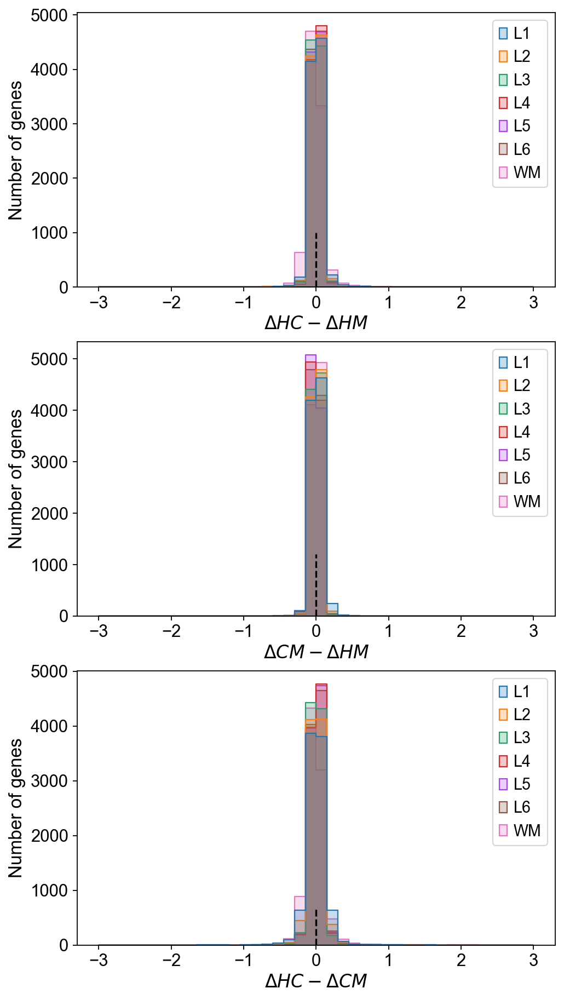

In [44]:
fig, ax = plt.subplots(3, 1, figsize=(7, 14))

data_to_plot = human_chimp_diff - human_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[0])
ax[0].vlines(0, ymin=0, ymax=1000, colors='black', linestyles='dashed')
ax[0].grid(False)
ax[0].set_xlabel('$\Delta HC - \Delta HM$', fontsize=15)
ax[0].set_ylabel('Number of genes', fontsize=15)

data_to_plot = chimp_macaque_diff - human_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[1])
ax[1].vlines(0, ymin=0, ymax=1200, colors='black', linestyles='dashed')
ax[1].grid(False)
ax[1].set_xlabel('$\Delta CM - \Delta HM$', fontsize=15)
ax[1].set_ylabel('Number of genes', fontsize=15)

data_to_plot = human_chimp_diff - chimp_macaque_diff
sns.histplot(data_to_plot, element="step", binrange=[-3, 3], bins=40, ax=ax[2])
ax[2].vlines(0, ymin=0, ymax=700, colors='black', linestyles='dashed')
ax[2].grid(False)
ax[2].set_xlabel('$\Delta HC - \Delta CM$', fontsize=15)
ax[2].set_ylabel('Number of genes', fontsize=15)

## Filter specie-specific profiles

### Let's explore

In [45]:
#human_chimp_diff, human_macaque_diff, chimp_macaque_diff

In [46]:
hc_l1_mean = human_chimp_diff.abs().sum(axis=1)
hm_l1_mean = human_macaque_diff.abs().sum(axis=1)
cm_l1_mean = chimp_macaque_diff.abs().sum(axis=1)

(0.0, 10.0)

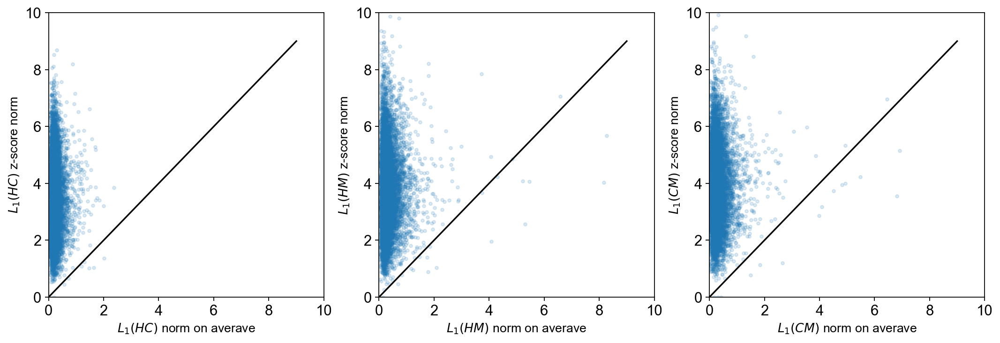

In [47]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))
intersect = hc_l1_mean.index.intersection(hc_l1.index)

ax[0].plot(hc_l1_mean.loc[intersect], hc_l1.loc[intersect], '.', alpha=0.15)
ax[0].plot([0, 9], [0, 9], 'black')
#ax[0].set_title('Normalization on average')
ax[0].set_xlabel('$L_1(HC)$ norm on averave', fontsize=12)
ax[0].set_ylabel('$L_1(HC)$ z-score norm', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 10)
ax[0].set_ylim(0, 10)

ax[1].plot(hm_l1_mean.loc[intersect], hm_l1.loc[intersect], '.', alpha=0.15)
ax[1].plot([0, 9], [0, 9], 'black')
#ax[1].set_title('Normalization on average')
ax[1].set_xlabel('$L_1(HM)$ norm on averave', fontsize=12)
ax[1].set_ylabel('$L_1(HM)$ z-score norm', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 10)
ax[1].set_ylim(0, 10)

ax[2].plot(cm_l1_mean.loc[intersect], cm_l1.loc[intersect], '.', alpha=0.15)
ax[2].plot([0, 9], [0, 9], 'black')
#ax[2].set_title('Normalization on average')
ax[2].set_xlabel('$L_1(CM)$ norm on averave', fontsize=12)
ax[2].set_ylabel('$L_1(CM)$ z-score norm', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 10)
ax[2].set_ylim(0, 10)

(0.0, 8.0)

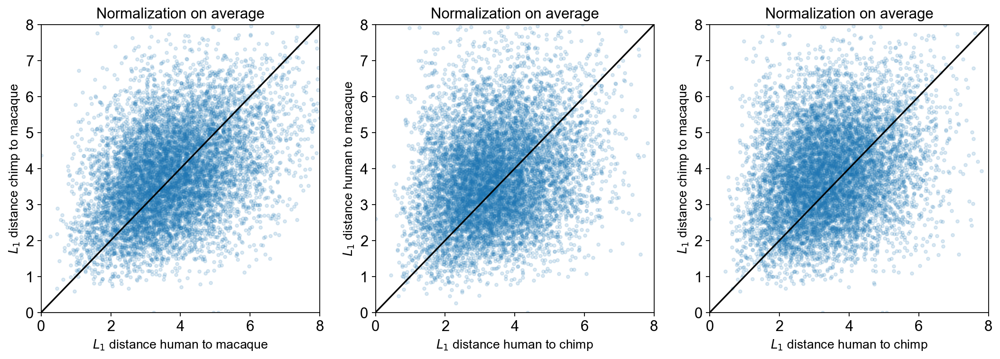

In [48]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

ax[0].plot(hm_l1, cm_l1, '.', alpha=0.15)
ax[0].plot([0, 9], [0, 9], 'black')
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('$L_1$ distance human to macaque', fontsize=12)
ax[0].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 8)
ax[0].set_ylim(0, 8)

ax[1].plot(hc_l1, hm_l1, '.', alpha=0.15)
ax[1].plot([0, 9], [0, 9], 'black')
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[1].set_ylabel('$L_1$ distance human to macaque', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 8)
ax[1].set_ylim(0, 8)

ax[2].plot(hc_l1, cm_l1, '.', alpha=0.15)
ax[2].plot([0, 9], [0, 9], 'black')
ax[2].set_title('Normalization on average')
ax[2].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[2].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 8)
ax[2].set_ylim(0, 8)

In [49]:
hc_l1 = human_chimp_diff.abs().sum(axis=1)
hm_l1 = human_macaque_diff.abs().sum(axis=1)
cm_l1 = chimp_macaque_diff.abs().sum(axis=1)

(0.0, 8.0)

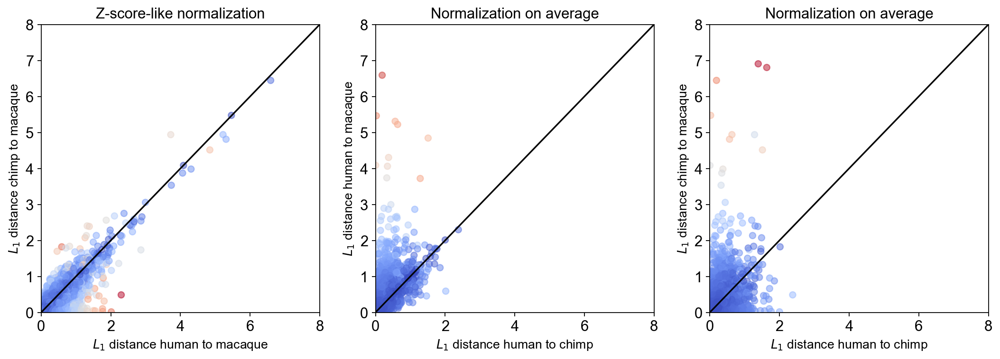

In [50]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

ax[0].scatter(hm_l1, cm_l1, alpha=0.5, c=hc_l1, cmap='coolwarm')
ax[0].plot([0, 9], [0, 9], 'black')
ax[0].set_title('Z-score-like normalization')
ax[0].set_xlabel('$L_1$ distance human to macaque', fontsize=12)
ax[0].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[0].grid(False)
ax[0].set_xlim(0, 8)
ax[0].set_ylim(0, 8)

ax[1].scatter(hc_l1, hm_l1, alpha=0.5, c=cm_l1, cmap='coolwarm')
ax[1].plot([0, 9], [0, 9], 'black')
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[1].set_ylabel('$L_1$ distance human to macaque', fontsize=12)
ax[1].grid(False)
ax[1].set_xlim(0, 8)
ax[1].set_ylim(0, 8)

ax[2].scatter(hc_l1, cm_l1, alpha=0.5, c=hm_l1, cmap='coolwarm')
ax[2].plot([0, 9], [0, 9], 'black')
ax[2].set_title('Normalization on average')
ax[2].set_xlabel('$L_1$ distance human to chimp', fontsize=12)
ax[2].set_ylabel('$L_1$ distance chimp to macaque', fontsize=12)
ax[2].grid(False)
ax[2].set_xlim(0, 8)
ax[2].set_ylim(0, 8)

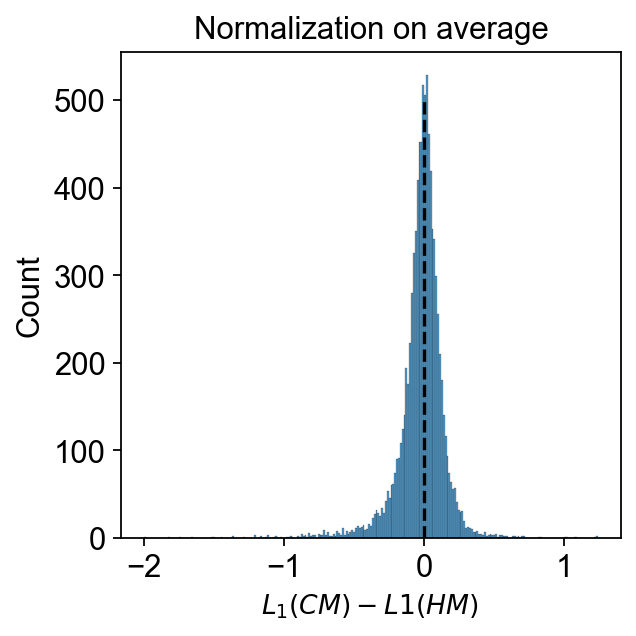

In [51]:
sns.histplot(cm_l1 - hm_l1)
plt.vlines(0, ymin=0, ymax=500, colors='black', linestyles='dashed')
plt.title('Normalization on average')
plt.xlabel('$L_1(CM) - L1(HM)$ ', fontsize=12)
plt.grid(False)

In [52]:
((cm_l1 - hm_l1) < 0).sum(), ((cm_l1 - hm_l1) > 0).sum()

(4719, 4488)

### Human-specific

Filter genes:
$$
L_1(HM) > L_1(CM)
$$

and

$$
L_1(HC) >= q
$$

In [53]:
quantile = 0.95
quant_value = hc_l1.quantile(quantile)
quant_value

0.5346964389085769

Text(0.5, 1.0, '$L_1$ distance human vs chimp')

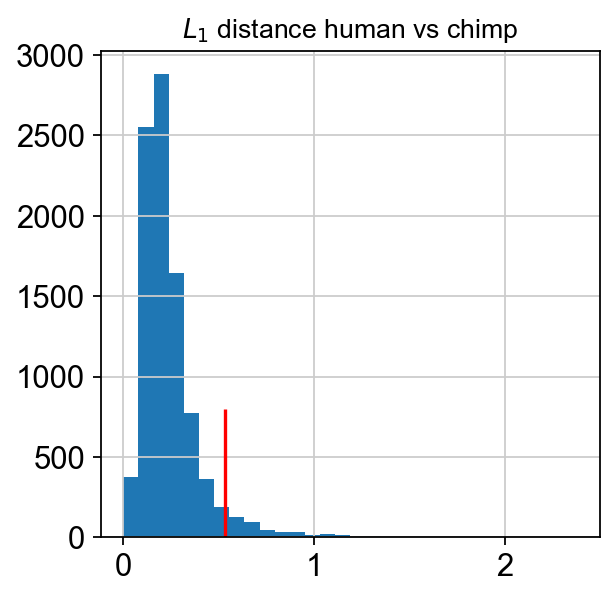

In [54]:
plt.vlines(quant_value, ymin=0, ymax=800,colors='red')
hc_l1.hist(bins=30)
plt.title('$L_1$ distance human vs chimp', fontsize=12)

In [55]:
gene_filter1 = (hm_l1 > cm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

461

In [56]:
hs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
hs_genes

Index(['ACSL4', 'ACTA2', 'ADCY1', 'ADD2', 'ADGRB3', 'ADRA2A', 'AGAP1',
       'AKR1C2', 'AKT3', 'ALCAM',
       ...
       'UST', 'VAT1L', 'VSTM2A', 'XKR4', 'XPR1', 'ZBTB18', 'ZBTB20', 'ZBTB34',
       'ZMYND8', 'ZNF385D'],
      dtype='object', length=324)

### Chimp-specific

In [57]:
gene_filter1 = (cm_l1 > hm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

461

In [58]:
cs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
cs_genes

Index(['ACTN2', 'AGT', 'AHNAK', 'B2M', 'B3GALT2', 'BAIAP2', 'BRINP3', 'CA10',
       'CALB2', 'CBLN2',
       ...
       'TIMP3', 'TNC', 'TSC22D4', 'TTC9B', 'TXNIP', 'UBE2QL1', 'VIM', 'VWF',
       'WASF1', 'WLS'],
      dtype='object', length=137)

### Macaque-specific

In [59]:
gene_filter1 = (hm_l1 > hc_l1)
gene_filter2 = (cm_l1 >= quant_value)
gene_filter2.sum()

1164

In [60]:
ms_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
ms_genes

Index(['AATK', 'ABAT', 'ABCA2', 'ABCD4', 'ABHD17B', 'ACAD10', 'ACADVL',
       'ACBD7', 'ACSBG1', 'ACSL1',
       ...
       'ZEB2', 'ZFAND3', 'ZFP36L1', 'ZFP36L2', 'ZIC2', 'ZMAT2', 'ZNF184',
       'ZNF483', 'ZNF536', 'ZNF664'],
      dtype='object', length=997)

### Compare a number of human-specific vs chimp-specific

In [61]:
qv_list = np.linspace(0, 4, 100)
hs_num = []
cs_num = []
ms_num = []
quant_list = [0.8, 0.85, 0.9, 0.95, 0.96, 0.97, 0.98, 0.99, 0.995, 0.999]
for qv in qv_list:
    #qv = hc_l1.quantile(q)
    # hs
    gene_filter1 = (hm_l1 > cm_l1)
    gene_filter2 = (hc_l1 >= qv)
    hs_num.append(hc_l1[(gene_filter1) & (gene_filter2)].index.size)
    # cs
    gene_filter1 = (cm_l1 > hm_l1)
    gene_filter2 = (hc_l1 >= qv)
    cs_num.append(hc_l1[(gene_filter1) & (gene_filter2)].index.size)
    # ms
    gene_filter1 = (hm_l1 > hc_l1)
    gene_filter2 = (cm_l1 >= qv)
    ms_num.append(hm_l1[(gene_filter1) & (gene_filter2)].index.size)

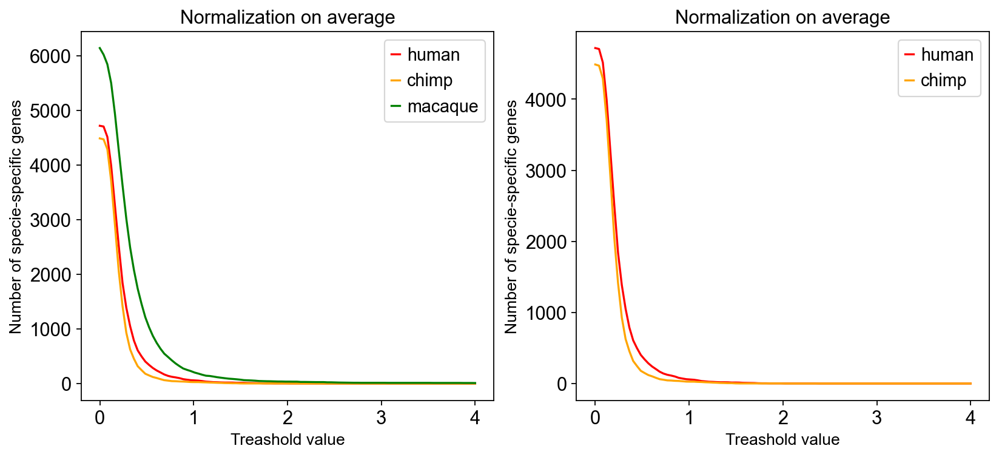

In [62]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].plot(qv_list, hs_num, 'r-')
ax[0].plot(qv_list, cs_num, '-', c='orange')
ax[0].plot(qv_list, ms_num, '-', c='green')
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('Number of specie-specific genes', fontsize=12)
ax[0].legend(['human', 'chimp', 'macaque'])
ax[0].grid(False)

ax[1].plot(qv_list, hs_num, 'r-')
ax[1].plot(qv_list, cs_num, '-', c='orange')
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('Number of specie-specific genes', fontsize=12)
ax[1].legend(['human', 'chimp', 'macaque'])
ax[1].grid(False)

treshold = 0.7676767676767677


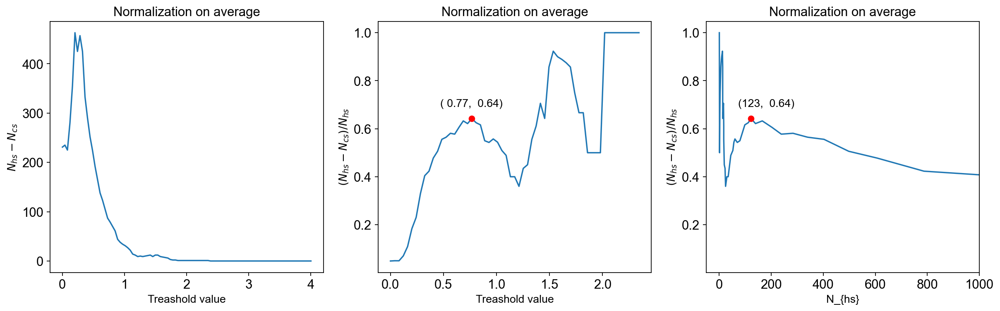

In [63]:
fig, ax = plt.subplots(1, 3, figsize=(18, 5))

hs_num = np.array(hs_num)
cs_num = np.array(cs_num)
qv_list_num = np.array(qv_list)
nonzero = (hs_num != 0)
ratio = (hs_num[nonzero] - cs_num[nonzero]) / hs_num[nonzero]
ratio_loc_max_idx = ratio[:ratio.size // 2].argmax()
qv_loc_max = qv_list_num[ratio_loc_max_idx]
print(f'treshold = {qv_loc_max}')

ax[0].plot(qv_list, hs_num - cs_num, '-')
#ax[0].hlines(0, xmin=0, xmax=4, colors='black', linestyles='dashed', alpha=0.7)
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('$N_{hs} - N_{cs}$', fontsize=12)
ax[0].grid(False)

ax[1].plot(qv_list_num[nonzero], ratio, '-')
ax[1].plot([qv_loc_max], [ratio[ratio_loc_max_idx]], 'ro')
ax[1].text(qv_loc_max - 0.3, ratio[ratio_loc_max_idx] + 0.05, f'({qv_loc_max: .2f}, {ratio[ratio_loc_max_idx]: .2f})', fontsize=12)
#ax[1].hlines(0, xmin=0, xmax=qv_list_num[nonzero].max(), colors='black', linestyles='dashed', alpha=0.7)
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('$(N_{hs} - N_{cs}) / N_{hs}$', fontsize=12)
ax[1].grid(False)

ax[2].plot(hs_num[nonzero], ratio, '-')
ax[2].plot([hs_num[ratio_loc_max_idx]], [ratio[ratio_loc_max_idx]], 'ro')
ax[2].text(hs_num[ratio_loc_max_idx] - 50, ratio[ratio_loc_max_idx] + 0.05, f'({hs_num[ratio_loc_max_idx]}, {ratio[ratio_loc_max_idx]: .2f})', fontsize=12)
#ax[2].hlines(0, xmin=0, xmax=qv_list_num[nonzero].max(), colors='black', linestyles='dashed', alpha=0.7)
ax[2].set_title('Normalization on average')
ax[2].set_xlabel('N_{hs}', fontsize=12)
ax[2].set_ylabel('$(N_{hs} - N_{cs}) / N_{hs}$', fontsize=12)
ax[2].set_xlim(-50, 1000)
ax[2].grid(False)

In [64]:
ratio

array([0.04895105, 0.04993625, 0.04983389, 0.07015786, 0.10902948,
       0.18351169, 0.23060228, 0.32972583, 0.40437678, 0.42312579,
       0.47775947, 0.5060241 , 0.55583127, 0.56470588, 0.58098592,
       0.57740586, 0.60591133, 0.63253012, 0.62142857, 0.64227642,
       0.625     , 0.61616162, 0.55      , 0.54285714, 0.55737705,
       0.54385965, 0.50943396, 0.48888889, 0.4       , 0.4       ,
       0.36      , 0.43478261, 0.45      , 0.55555556, 0.61111111,
       0.70588235, 0.64285714, 0.85714286, 0.92307692, 0.9       ,
       0.88888889, 0.875     , 0.85714286, 0.75      , 0.66666667,
       0.66666667, 0.5       , 0.5       , 0.5       , 0.5       ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        ])

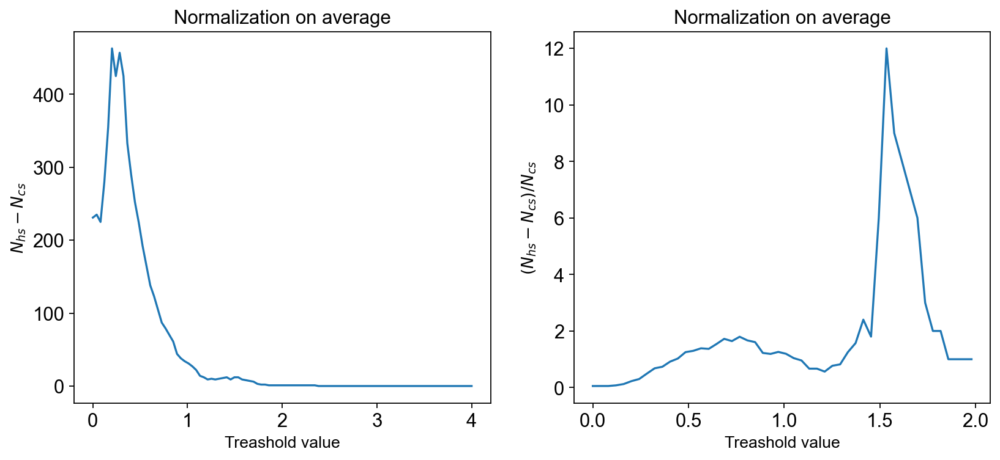

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

hs_num = np.array(hs_num)
cs_num = np.array(cs_num)
qv_list_num = np.array(qv_list)
nonzero = (cs_num != 0)
ratio = (hs_num[nonzero] - cs_num[nonzero]) / cs_num[nonzero]
#ratio_loc_max_idx = ratio[:ratio.size // 2].argmax()
#qv_loc_max = qv_list_num[ratio_loc_max_idx]
#print(f'treshold = {qv_loc_max}')

ax[0].plot(qv_list, hs_num - cs_num, '-')
#ax[0].hlines(0, xmin=0, xmax=4, colors='black', linestyles='dashed', alpha=0.7)
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('$N_{hs} - N_{cs}$', fontsize=12)
ax[0].grid(False)

ax[1].plot(qv_list_num[nonzero], ratio, '-')
#ax[1].plot([qv_loc_max], [ratio[ratio_loc_max_idx]], 'ro')
#ax[1].text(qv_loc_max - 0.3, ratio[ratio_loc_max_idx] + 0.05, f'({qv_loc_max: .2f}, {ratio[ratio_loc_max_idx]: .2f})', fontsize=12)
#ax[1].hlines(0, xmin=0, xmax=qv_list_num[nonzero].max(), colors='black', linestyles='dashed', alpha=0.7)
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('$(N_{hs} - N_{cs}) / N_{сs}$', fontsize=12)
ax[1].grid(False)

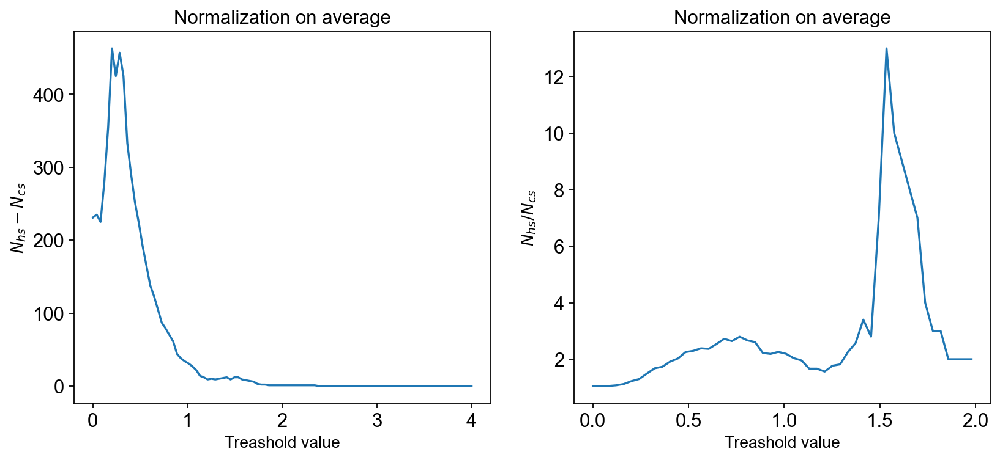

In [66]:
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

hs_num = np.array(hs_num)
cs_num = np.array(cs_num)
qv_list_num = np.array(qv_list)
nonzero = (cs_num != 0)
ratio = hs_num[nonzero] / cs_num[nonzero]
#ratio_loc_max_idx = ratio[:ratio.size // 2].argmax()
#qv_loc_max = qv_list_num[ratio_loc_max_idx]
#print(f'treshold = {qv_loc_max}')

ax[0].plot(qv_list, hs_num - cs_num, '-')
#ax[0].hlines(0, xmin=0, xmax=4, colors='black', linestyles='dashed', alpha=0.7)
ax[0].set_title('Normalization on average')
ax[0].set_xlabel('Treashold value', fontsize=12)
ax[0].set_ylabel('$N_{hs} - N_{cs}$', fontsize=12)
ax[0].grid(False)

ax[1].plot(qv_list_num[nonzero], ratio, '-')
#ax[1].plot([qv_loc_max], [ratio[ratio_loc_max_idx]], 'ro')
#ax[1].text(qv_loc_max - 0.3, ratio[ratio_loc_max_idx] + 0.05, f'({qv_loc_max: .2f}, {ratio[ratio_loc_max_idx]: .2f})', fontsize=12)
#ax[1].hlines(0, xmin=0, xmax=qv_list_num[nonzero].max(), colors='black', linestyles='dashed', alpha=0.7)
ax[1].set_title('Normalization on average')
ax[1].set_xlabel('Treashold value', fontsize=12)
ax[1].set_ylabel('$N_{hs}/ N_{cs}$', fontsize=12)
ax[1].grid(False)

In [67]:
argmax = ratio[:ratio.size // 2].argmax()
qv_list_num[argmax]

0.7676767676767677

In [68]:
diff = hs_num - cs_num
hs_num[(diff == 457)], cs_num[(diff == 457)]

(array([1386]), array([929]))

## Explore specie-specific genes

### Apply treashold

#### Human-specific

In [69]:
quant_value = qv_loc_max

In [70]:
gene_filter1 = (hm_l1 > cm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

167

In [71]:
hs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
hs_genes

Index(['IGSF21', 'IFI6', 'GRIK3', 'SSBP3', 'DAB1', 'NEGR1', 'SYT6', 'MAN1A2',
       'RGS4', 'DNM3',
       ...
       'SSTR2', 'MBP', 'SLC17A7', 'ETFB', 'GRK3', 'SCUBE1', 'NRIP1', 'NCAM2',
       'TTC3', 'PCP4'],
      dtype='object', length=123)

#### Chimp-specific

In [72]:
gene_filter1 = (cm_l1 > hm_l1)
gene_filter2 = (hc_l1 >= quant_value)
gene_filter2.sum()

167

In [73]:
cs_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
cs_genes, cs_genes.size

(Index(['ID3', 'NFIA', 'GLUL', 'B3GALT2', 'AGT', 'ACTN2', 'RPRM', 'NR4A2',
        'IGFBP5', 'SNORC', 'CLEC3B', 'EPHA3', 'MASP1', 'SST', 'RASL11B', 'SPP1',
        'MCUB', 'CXCL14', 'SPARC', 'WASF1', 'QKI', 'ETV1', 'NEUROD6', 'DYNC1I1',
        'TSC22D4', 'RELN', 'ITM2A', 'SULF1', 'SPON1', 'NELL1', 'SLC1A2',
        'GRIA4', 'CRYAB', 'CYP26A1', 'MOAP1', 'THBS1', 'SV2B', 'CALB2', 'NPTX1',
        'CELF4', 'CBLN2', 'ID1', 'TIMP3', 'MLC1'],
       dtype='object'),
 44)

#### Macaque-specific

In [74]:
gene_filter1 = (hm_l1 > hc_l1)
gene_filter2 = (cm_l1 >= quant_value)
gene_filter2.sum()

480

In [75]:
ms_genes = hc_l1[(gene_filter1) & (gene_filter2)].index
ms_genes

Index(['GABRD', 'FBXO2', 'NPPA', 'PADI2', 'CAMK2N1', 'ID3', 'CLIC4',
       'MARCKSL1', 'HPCA', 'MED8',
       ...
       'AIFM3', 'MN1', 'SOX10', 'CBX6', 'SYNGR1', 'FBLN1', 'GRIK1', 'PCP4',
       'COL6A2', 'S100B'],
      dtype='object', length=424)

In [76]:
import pickle

genes_dict = {
    'human': hs_genes,
    'chimp': cs_genes,
    'macaque': ms_genes
}
# save all gene lists
with open('results/specie_specific_genes.pkl', 'wb') as f:
    pickle.dump(genes_dict, f)

### Cluster genes

In [77]:
df = pd.DataFrame(adata_pb_norm_mean.X, index=adata_pb_norm_mean.obs_names, columns=adata_pb_norm_mean.var_names)
df.head()

,NOC2L,HES4,AGRN,SDF4,B3GALT6,UBE2J2,SCNN1D,ACAP3,PUSL1,INTS11,...,SLC19A1,COL6A2,SPATC1L,LSS,MCM3AP,YBEY,PCNT,DIP2A,S100B,PRMT2
WM.human_759,-0.029434,0.000060,-0.043513,-0.047352,0.019730,0.073377,-0.025426,0.066394,-0.005994,0.083730,...,-0.024605,-0.030153,0.062796,0.006477,0.006101,-0.060417,0.043866,0.194249,-0.013059,0.086238
L5.human_759,0.041378,-0.070859,0.081056,-0.035505,0.081751,0.024801,-0.044137,-0.004835,0.042257,-0.097683,...,0.050453,0.024884,0.031172,-0.011941,0.004423,0.048610,0.010844,-0.003836,-0.163151,-0.036175
L2.human_759,0.003540,0.078116,-0.094614,0.048347,-0.015289,-0.041880,0.051197,-0.011478,-0.012885,0.011412,...,-0.101996,-0.067572,0.010210,-0.086683,-0.034970,0.014981,-0.022672,-0.073343,-0.099143,0.033223
L3.human_759,0.014209,0.003650,0.055936,-0.024306,-0.030928,-0.005821,-0.020386,-0.024487,0.006003,0.040760,...,0.006111,-0.036663,-0.056161,-0.006650,0.039214,-0.016340,-0.015449,-0.077759,-0.158493,-0.059132
L1.human_759,-0.084783,0.076086,-0.060492,0.055313,-0.022007,-0.051856,-0.003284,-0.015899,-0.068717,0.025030,...,0.063681,0.174612,-0.047302,0.132038,-0.019618,0.023529,0.050175,0.009793,0.679210,0.060245


In [78]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = samples.sort_values()
    order_laminar = order[order.str.contains('L')].tolist()
    order_wm = order[order.str.contains('WM')].tolist()
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]

### Human

#### Hierarchial clustering

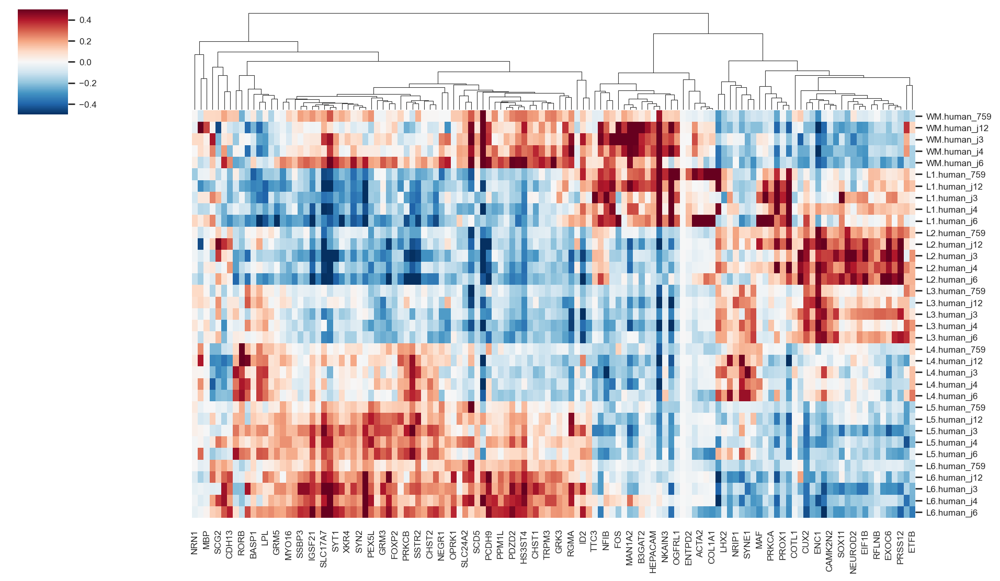

In [79]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[hs_genes].loc[sample_order['human']], figsize=(12, 7), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

<Axes: >

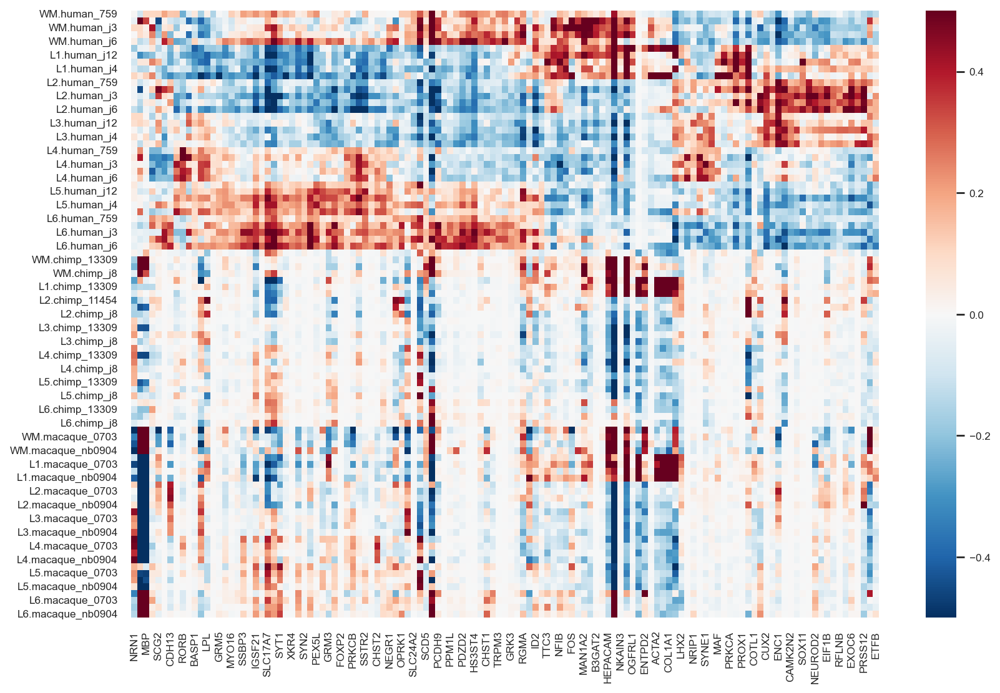

In [80]:
#sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
reordered_genes = clustergrid.dendrogram_col.reordered_ind
gene_order = hs_genes[reordered_genes]
sns.heatmap(df[gene_order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

D:\Projects\diploma\venv_jup\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


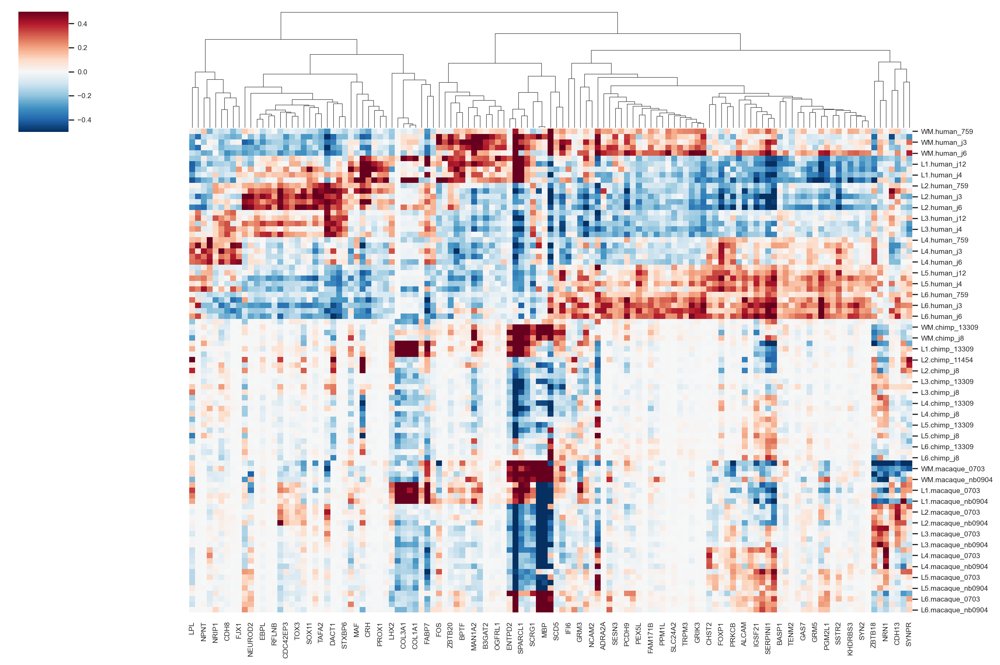

In [81]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[hs_genes], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

#### Spectral clustering

In [82]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[hs_genes].loc[sample_order['human']].T, metric='cosine') + 1
n_clusters = 4
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=4,
                   random_state=4)

In [83]:
labels = pd.Series(clustering.labels_, index=hs_genes).sort_values()
order = labels.sort_values().index

<Axes: >

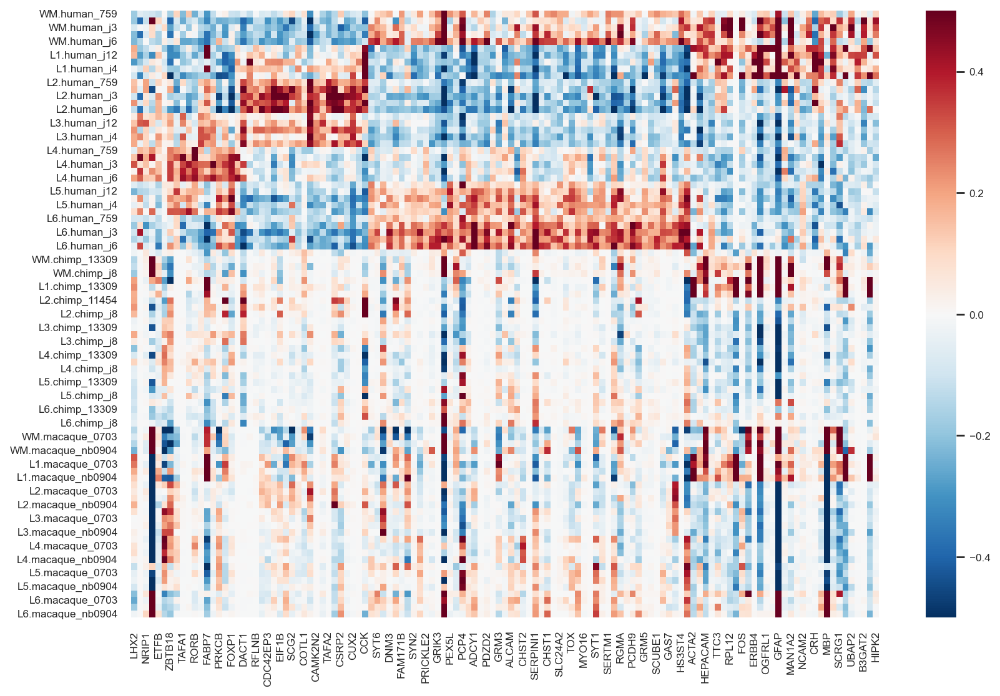

In [84]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

In [85]:
df_annotation = df[hs_genes].copy()
df_annotation['layer'] = adata_pb_norm_mean.obs.layer
df_annotation['condition'] = adata_pb_norm_mean.obs.condition

In [86]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

IGSF21      IFI6     GRIK3     SSBP3      DAB1     NEGR1  \
condition layer                                                               
chimp     L1    -0.170372 -0.034785 -0.010471 -0.002194  0.010024 -0.006724   
          L2    -0.106329  0.080246 -0.002373 -0.006115  0.029499 -0.006568   
          L3    -0.017973  0.016376 -0.008614 -0.007944  0.010304 -0.000181   
          L4     0.142036 -0.095827 -0.005589  0.010349 -0.004430  0.002340   
          L5     0.155632 -0.008999  0.001327  0.005843 -0.019621 -0.001013   

                     SYT6    MAN1A2      RGS4      DNM3  ...     SSTR2  \
condition layer                                          ...             
chimp     L1    -0.007645  0.225271 -0.186101  0.010853  ... -0.000622   
          L2     0.000453 -0.043890 -0.248340 -0.005756  ... -0.000622   
          L3    -0.013752 -0.211148  0.074303 -0.014904  ... -0.005372   
          L4    -0.005670 -0.239615  0.167778 -0.024864  ...  0.010034   
          L5     0.001203 -0.101498  0.137853 -0.002541  ... -0.005106   

                      MBP   SLC17A7      ETFB      GRK3    SCUBE1     NRIP1  \
condition layer                                                               
chimp     L1    -0.059311 -0.434409  0.148219 -0.008621 -0.000401 -0.011897   
          L2    -0.181467 -0.351992 -0.040344 -0.020414 -0.018027 -0.003694   
          L3    -0.191508 -0.036281 -0.038414  0.000487 -0.024141 -0.003605   
          L4    -0.190633  0.115215  0.004832 -0.012818 -0.028680 -0.010834   
          L5    -0.134189  0.160074 -0.031816 -0.008305  0.009625 -0.005864   

                    NCAM2      TTC3      PCP4  
condition layer                                
chimp     L1     0.068495  0.146501 -0.279652  
          L2     0.030706 -0.025526 -0.395507  
          L3    -0.006989 -0.097487 -0.262731  
          L4    -0.003119 -0.118147  0.188136  
          L5    -0.013320 -0.079551  0.355865  

[5 rows x 123 columns]

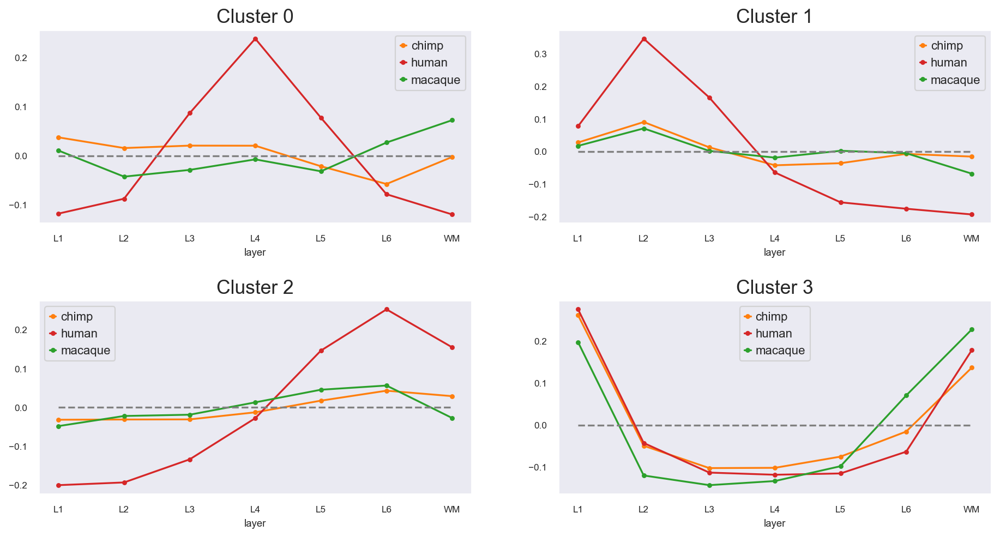

In [87]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

### Chimp

#### Hierarchial clustering

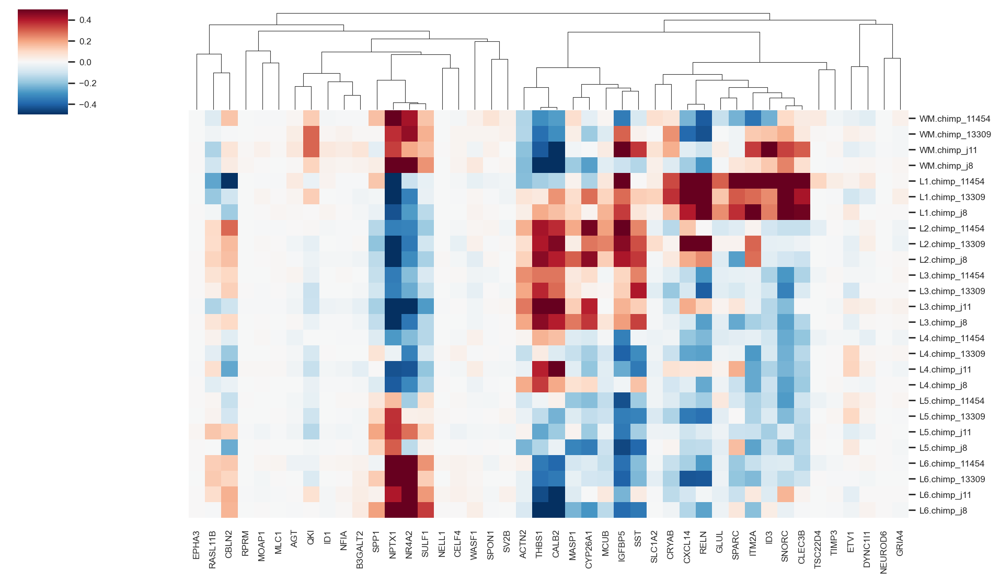

In [88]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[cs_genes].loc[sample_order['chimp']], figsize=(12, 7), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

<Axes: >

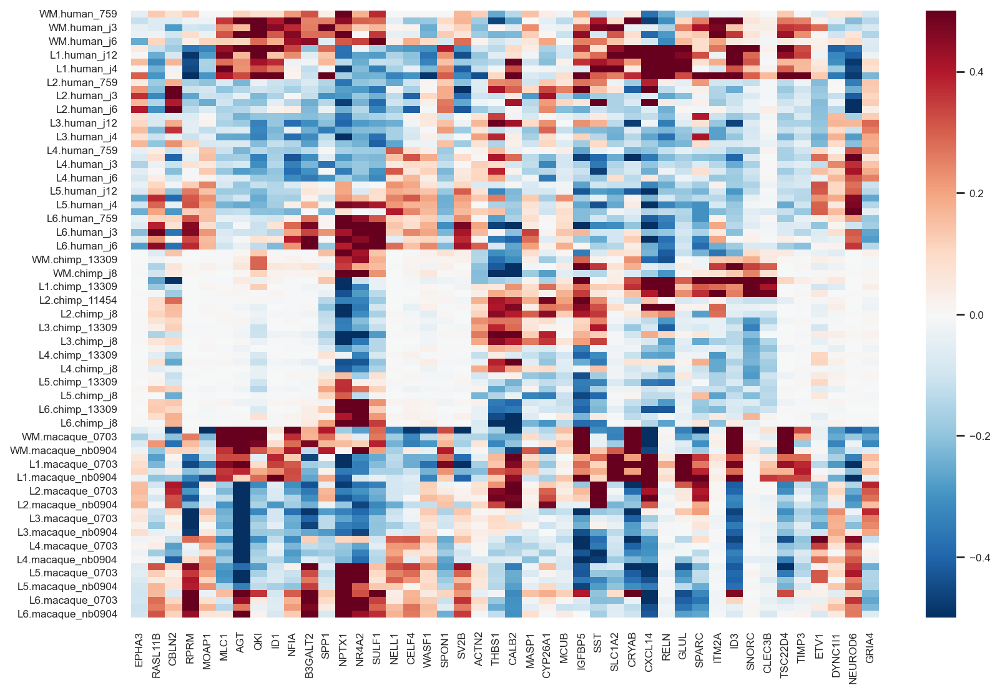

In [89]:
#sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
reordered_genes = clustergrid.dendrogram_col.reordered_ind
gene_order = cs_genes[reordered_genes]
sns.heatmap(df[gene_order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

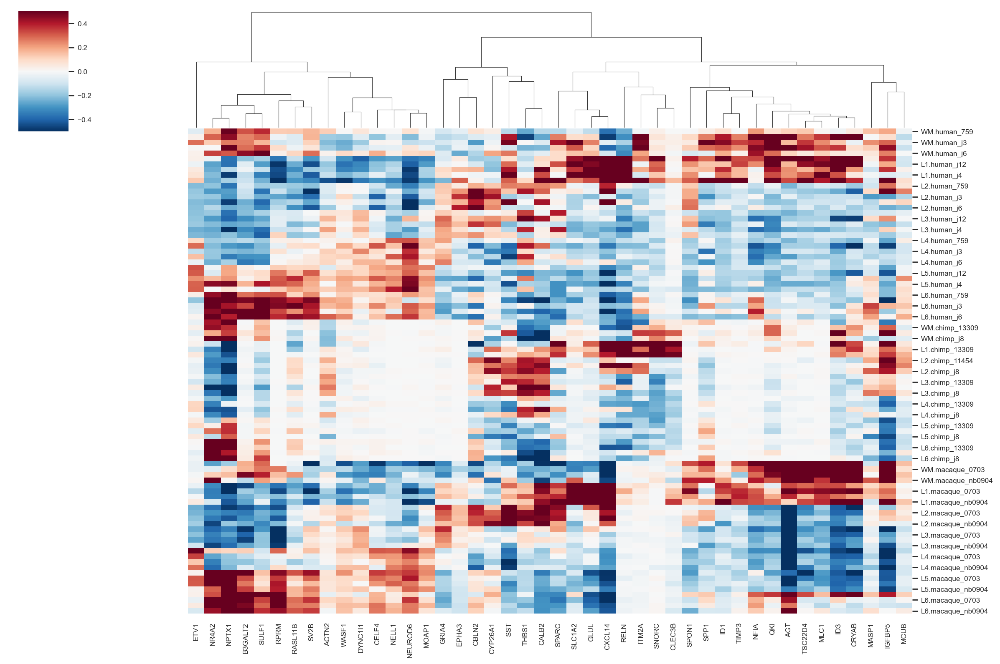

In [90]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[cs_genes], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

#### Spectral clustering

In [91]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[cs_genes].loc[sample_order['chimp']].T, metric='cosine') + 1
n_clusters = 3
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=3,
                   random_state=4)

In [92]:
labels = pd.Series(clustering.labels_, index=cs_genes).sort_values()
order = labels.sort_values().index

<Axes: >

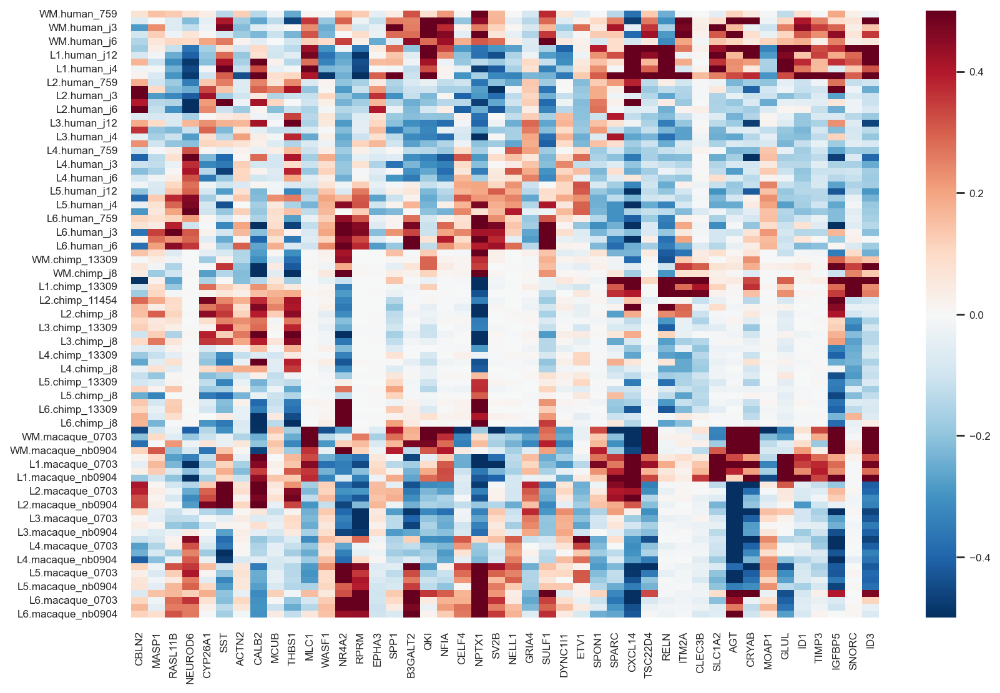

In [93]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

In [94]:
df_annotation = df[cs_genes].copy()
df_annotation['layer'] = adata_pb_norm_mean.obs.layer
df_annotation['condition'] = adata_pb_norm_mean.obs.condition

In [95]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

ID3      NFIA      GLUL   B3GALT2       AGT     ACTN2  \
condition layer                                                               
chimp     L1     0.423849 -0.003806  0.223358 -0.011758  0.021529 -0.037919   
          L2    -0.064425 -0.007727 -0.042800 -0.007582 -0.007189  0.125905   
          L3    -0.133959 -0.005874 -0.035769 -0.017814 -0.003313  0.220166   
          L4    -0.109587 -0.008788 -0.022605 -0.015910 -0.015196  0.011400   
          L5    -0.121085 -0.004017 -0.019982 -0.005646 -0.011233 -0.084475   

                     RPRM     NR4A2    IGFBP5     SNORC  ...     MOAP1  \
condition layer                                          ...             
chimp     L1    -0.000876 -0.241942  0.424500  0.784803  ...  0.003478   
          L2    -0.000876 -0.334736  0.539765 -0.083172  ...  0.000902   
          L3    -0.000890 -0.348132  0.153417 -0.279345  ... -0.002679   
          L4     0.001046 -0.326325 -0.254350 -0.250083  ...  0.001735   
          L5    -0.000635 -0.000693 -0.399171 -0.196144  ... -0.004362   

                    THBS1      SV2B     CALB2     NPTX1     CELF4     CBLN2  \
condition layer                                                               
chimp     L1     0.020860 -0.013757  0.076765 -0.509705 -0.005826 -0.257330   
          L2     0.423602 -0.005658  0.410350 -0.484577 -0.020422  0.197283   
          L3     0.458362 -0.000905  0.422842 -0.476520 -0.001741  0.055974   
          L4     0.238344 -0.005921  0.213624 -0.292203 -0.000294 -0.133812   
          L5    -0.139947 -0.001379 -0.105568  0.297549 -0.005089 -0.085236   

                      ID1     TIMP3      MLC1  
condition layer                                
chimp     L1     0.009308  0.013124  0.001184  
          L2    -0.007840 -0.002590  0.000024  
          L3    -0.008007 -0.000226 -0.000161  
          L4    -0.004048  0.000089 -0.000351  
          L5    -0.004768 -0.001387 -0.001264  

[5 rows x 44 columns]

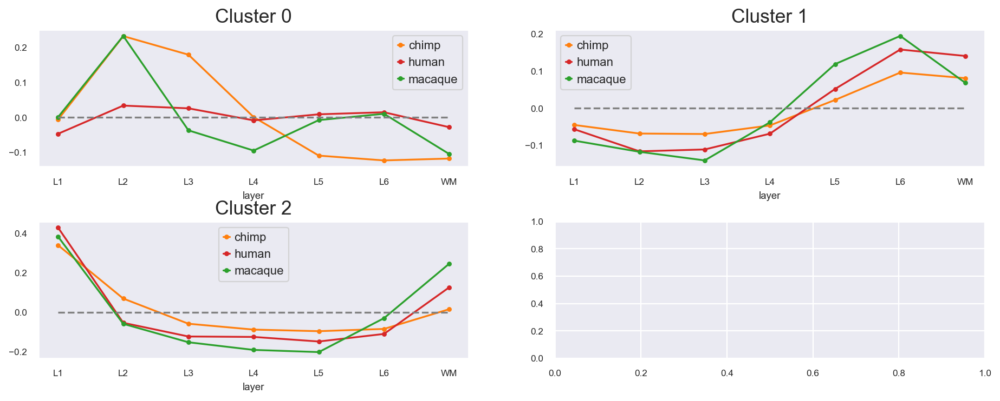

In [96]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

### Macaque

#### Hierarchial clustering

D:\Projects\diploma\venv_jup\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


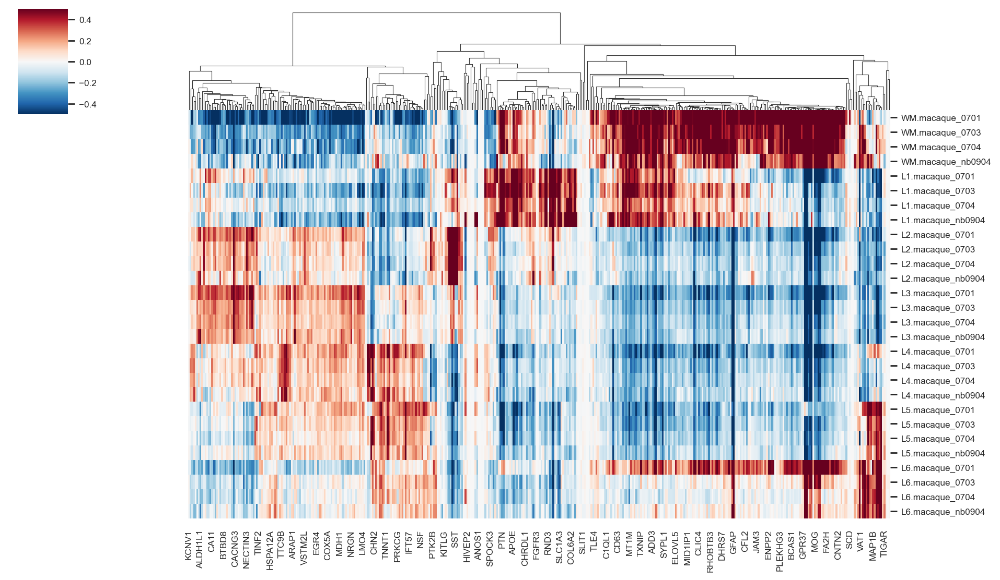

In [97]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[ms_genes].loc[sample_order['macaque']], figsize=(12, 7), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

<Axes: >

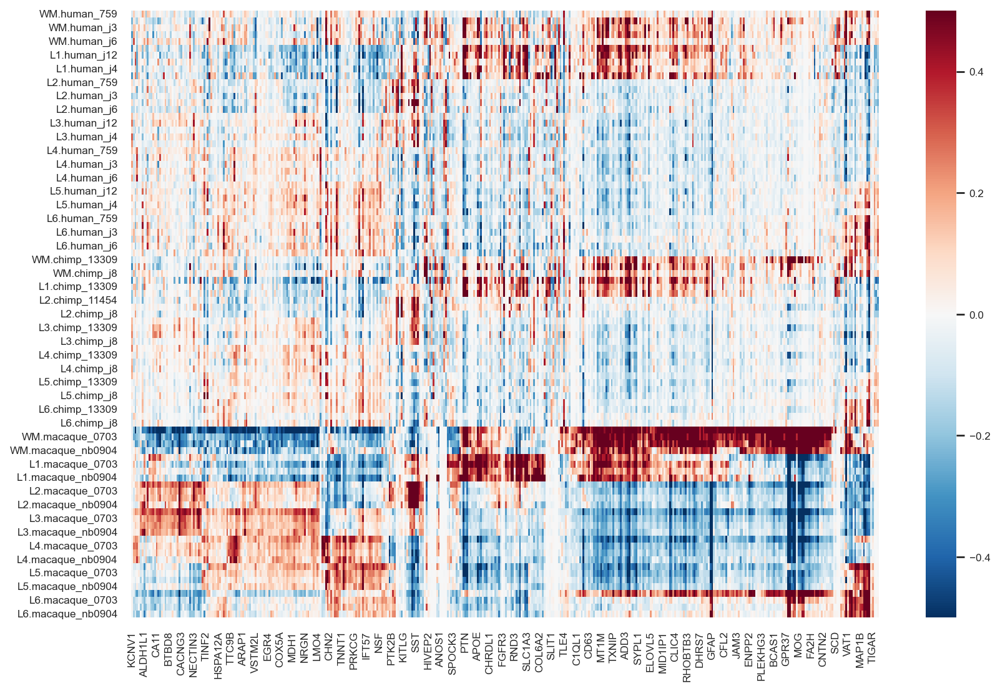

In [98]:
#sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
reordered_genes = clustergrid.dendrogram_col.reordered_ind
gene_order = ms_genes[reordered_genes]
sns.heatmap(df[gene_order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

D:\Projects\diploma\venv_jup\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


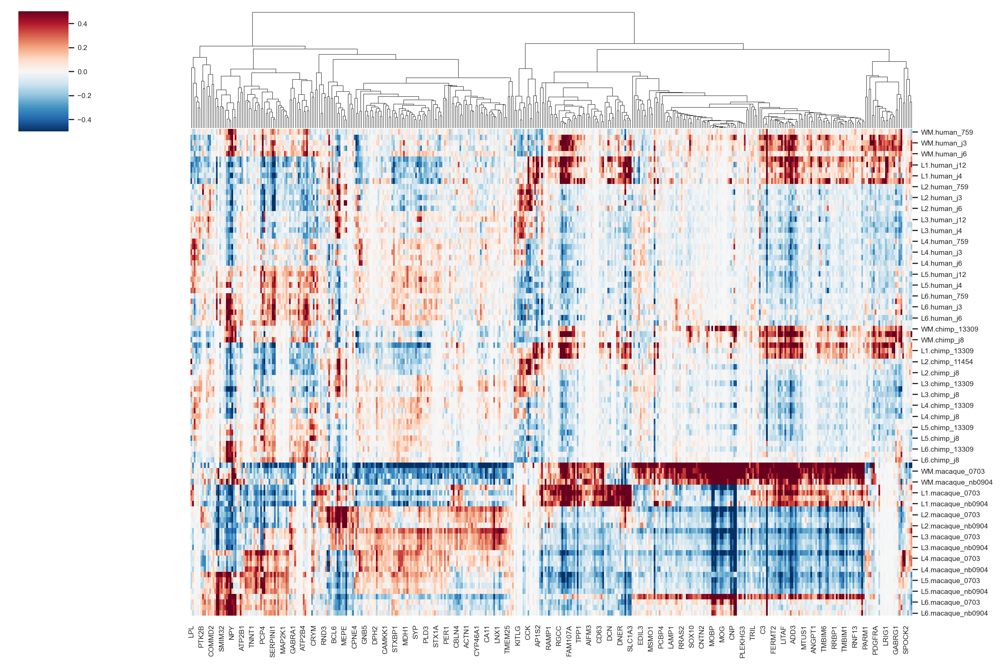

In [99]:
sns.set(font_scale=0.7)
clustergrid = sns.clustermap(df[ms_genes], figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.5, vmin=-0.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False)

#### Spectral clustering

In [100]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df[ms_genes].loc[sample_order['macaque']].T, metric='cosine') + 1
n_clusters = 4
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=4,
                   random_state=4)

In [101]:
labels = pd.Series(clustering.labels_, index=ms_genes).sort_values()
order = labels.sort_values().index

<Axes: >

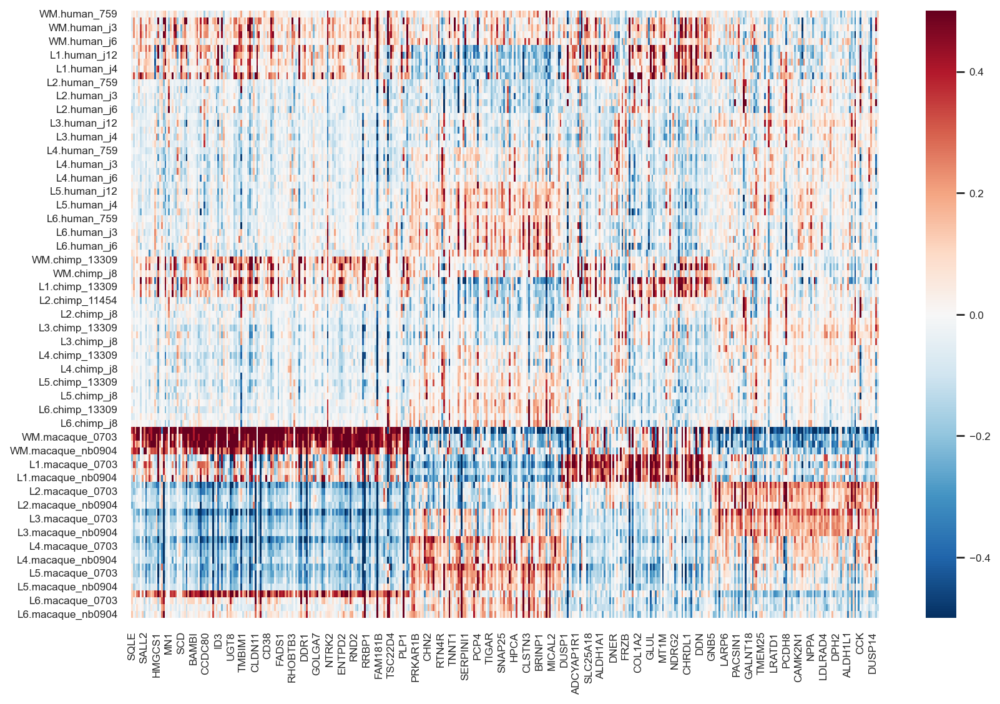

In [102]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.5, vmin=-0.5, center=0)

In [103]:
df_annotation = df[ms_genes].copy()
df_annotation['layer'] = adata_pb_norm_mean.obs.layer
df_annotation['condition'] = adata_pb_norm_mean.obs.condition

In [104]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

GABRD     FBXO2      NPPA     PADI2   CAMK2N1       ID3  \
condition layer                                                               
chimp     L1    -0.089581  0.207963 -0.183020  0.131832 -0.065439  0.423849   
          L2    -0.079450  0.023192 -0.129264 -0.029039 -0.058095 -0.064425   
          L3     0.126887 -0.011411 -0.083598 -0.051789  0.075883 -0.133959   
          L4     0.045547 -0.028501 -0.015886 -0.048598  0.029099 -0.109587   
          L5    -0.046561 -0.033493  0.103722 -0.054563  0.012826 -0.121085   

                    CLIC4  MARCKSL1      HPCA      MED8  ...     AIFM3  \
condition layer                                          ...             
chimp     L1     0.370905 -0.019855 -0.256735 -0.093580  ... -0.000345   
          L2    -0.032391  0.160922 -0.024389  0.003749  ... -0.000345   
          L3    -0.097667  0.034581 -0.015306  0.002791  ...  0.000418   
          L4    -0.147459  0.007684  0.161500  0.049880  ... -0.000252   
          L5    -0.096996 -0.008799  0.129076  0.023898  ...  0.000692   

                      MN1     SOX10      CBX6    SYNGR1     FBLN1     GRIK1  \
condition layer                                                               
chimp     L1     0.077133  0.013397 -0.004163 -0.226965  0.518149 -0.118889   
          L2     0.268745 -0.023337  0.027526 -0.084114  0.005633  0.002800   
          L3     0.128795 -0.071600  0.037610  0.046903 -0.119324 -0.113959   
          L4    -0.044665 -0.062631  0.005468  0.092887 -0.093919 -0.024064   
          L5    -0.105582 -0.050002 -0.048218  0.071316 -0.057391  0.088525   

                     PCP4    COL6A2     S100B  
condition layer                                
chimp     L1    -0.279652 -0.002255  0.664583  
          L2    -0.395507 -0.002255 -0.109790  
          L3    -0.262731 -0.001930 -0.193735  
          L4     0.188136 -0.001930 -0.218663  
          L5     0.355865 -0.001930 -0.225816  

[5 rows x 424 columns]

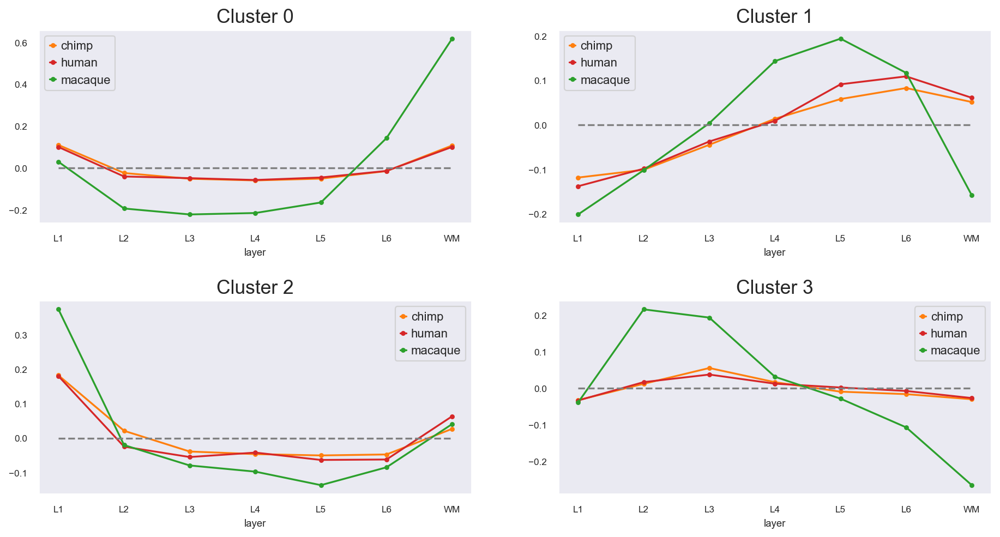

In [105]:
fig, axes = plt.subplots((n_clusters + 1) // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})
sns.set(font_scale=1)
for label, ax in zip(labels.unique(), axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')

In [106]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [113]:
labels = pd.Series(clustering.labels_, index=df.columns).sort_values()
order = labels.sort_values().index
labels.to_csv('results/mean_norm_clust_allgenes.csv')

<Axes: >

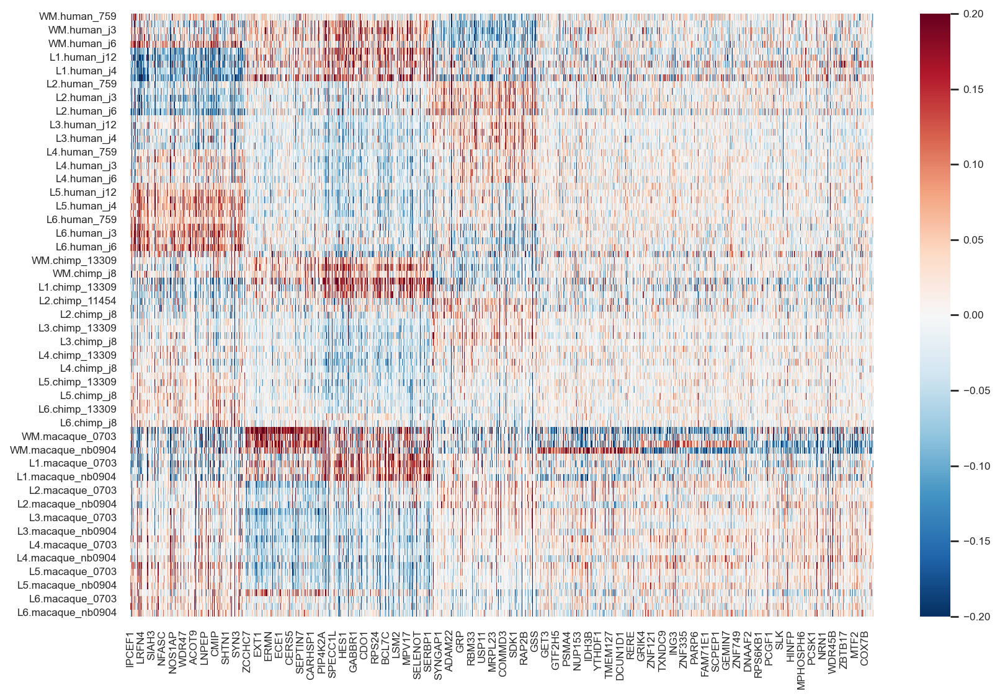

In [112]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.2, vmin=-0.2, center=0)

In [114]:
df = pd.DataFrame(adata_pb_norm.X, index=adata_pb_norm.obs_names, columns=adata_pb_norm.var_names)
df.head()

,NOC2L,HES4,AGRN,SDF4,B3GALT6,UBE2J2,SCNN1D,ACAP3,PUSL1,INTS11,...,SLC19A1,COL6A2,SPATC1L,LSS,MCM3AP,YBEY,PCNT,DIP2A,S100B,PRMT2
WM.human_759,-0.650878,0.001029,-0.587605,-0.980993,0.472367,1.702099,-0.763371,2.107840,-0.168666,1.413201,...,-0.445986,-0.369059,1.371567,0.091970,0.263215,-1.660742,1.229293,2.069564,-0.043002,1.253314
L5.human_759,0.915017,-1.205565,1.094584,-0.735551,1.957271,0.575298,-1.325118,-0.153488,1.188971,-1.648704,...,0.914502,0.304568,0.680849,-0.169549,0.190831,1.336182,0.303885,-0.040874,-0.537251,-0.525737
L2.human_759,0.078276,1.329032,-1.277674,1.001606,-0.366053,-0.971476,1.537086,-0.364400,-0.362555,0.192616,...,-1.848748,-0.827055,0.223001,-1.230772,-1.508703,0.411800,-0.635369,-0.781407,-0.326476,0.482834
L3.human_759,0.314214,0.062098,0.755363,-0.503540,-0.740480,-0.135018,-0.612045,-0.777390,0.168894,0.687944,...,0.110767,-0.448743,-1.226639,-0.094421,1.691777,-0.449152,-0.432952,-0.828458,-0.521913,-0.859364
L1.human_759,-1.874858,1.294498,-0.816885,1.145918,-0.526890,-1.202880,-0.098583,-0.504741,-1.933483,0.422461,...,1.154257,2.137187,-1.033139,1.874758,-0.846384,0.646753,1.406117,0.104341,2.236617,0.875557


In [115]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = samples.sort_values()
    order_laminar = order[order.str.contains('L')].tolist()
    order_wm = order[order.str.contains('WM')].tolist()
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]

In [116]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [117]:
labels = pd.Series(clustering.labels_, index=df.columns).sort_values()
order = labels.sort_values().index
labels.to_csv('results/zscore_norm_clust_allgenes.csv')

<Axes: >

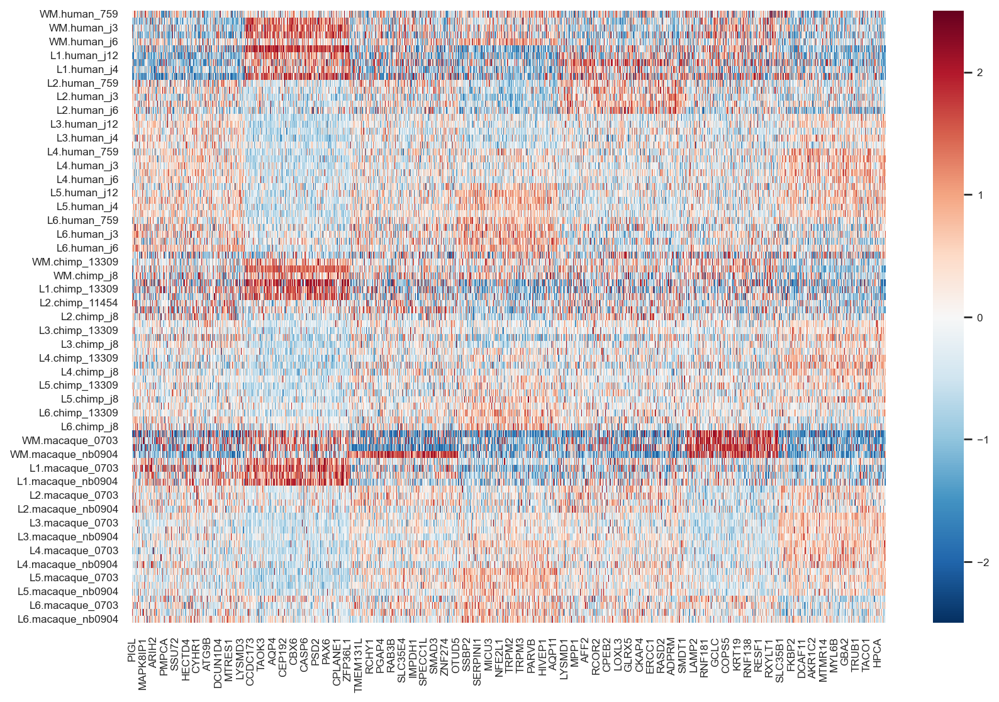

In [119]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)